In [1]:
import pandas as pd 
import numpy as np
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns


In [27]:
bld = pd.read_csv('building_info.csv')
smp = pd.read_csv('sample_submission.csv')
test = pd.read_csv('test.csv')
train = pd.read_csv('train.csv')

In [28]:


# Rename columns
bld.rename(columns={
    "건물번호": "Building Number",
    "건물유형": "Building Type",
    "연면적(m2)": "Total Floor Area (m²)",
    "냉방면적(m2)": "Air-conditioned Area (m²)",
    "태양광용량(kW)": "Solar Power Capacity (kW)",
    "ESS저장용량(kWh)": "ESS Storage Capacity (kWh)",
    "PCS용량(kW)": "PCS Capacity (kW)"
}, inplace=True)
building_type_map = {
    '호텔': 'Hotel',
    '상용': 'Commercial',
    '병원': 'Hospital',
    '학교': 'School',
    '건물기타': 'Other Building',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '백화점': 'Department Store',
    'IDC(전화국)': 'IDC (Telecom Center)',
    '공공': 'Public Facility'
}

bld['Building Type'] = bld['Building Type'].replace(building_type_map)
test.rename(columns={
    
    "건물번호": "Building Number",
    "일시": "Datetime",
    "기온(°C)": "Temperature (°C)",
    "강수량(mm)": "Precipitation (mm)",
    "풍속(m/s)": "Wind Speed (m/s)",
    "습도(%)": "Humidity (%)"
}, inplace=True)

train.rename(columns={
    "건물번호": "Building Number",
    "일시": "Datetime",
    "기온(°C)": "Temperature (°C)",
    "강수량(mm)": "Precipitation (mm)",
    "풍속(m/s)": "Wind Speed (m/s)",
    "습도(%)": "Humidity (%)",
    "일조(hr)": "Sunshine Duration (hr)",
    "일사(MJ/m2)": "Solar Radiation (MJ/m²)",
    "전력소비량(kWh)": "Power Consumption (kWh)"
}, inplace=True)





In [29]:
train['Datetime'] = pd.to_datetime(train['Datetime'])
train['Hour'] = train['Datetime'].dt.hour
train['Day'] = train['Datetime'].dt.day


In [30]:
test['Datetime'] = pd.to_datetime(test['Datetime'])
test['Hour'] = test['Datetime'].dt.hour
test['Day'] = test['Datetime'].dt.day

In [31]:
train = train.merge(bld[['Building Number','Air-conditioned Area (m²)', 'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)', 'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)']], on='Building Number', how='left')

In [32]:
train = train.replace('-', 0)
train.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),Hour,Day,Air-conditioned Area (m²),Total Floor Area (m²),Building Type,Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80,0,1,77586.0,82912.71,Hotel,0,0,0
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.0,5591.85,1,1,77586.0,82912.71,Hotel,0,0,0
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.0,5338.17,2,1,77586.0,82912.71,Hotel,0,0,0
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.0,4554.42,3,1,77586.0,82912.71,Hotel,0,0,0
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.0,3602.25,4,1,77586.0,82912.71,Hotel,0,0,0


In [33]:
train['Sunshine Duration (hr)'].value_counts()

Sunshine Duration (hr)
0.0    122847
1.0     30856
0.9      7444
0.1      6491
0.8      5716
0.2      5398
0.7      5362
0.6      5231
0.3      5018
0.5      4923
0.4      4714
Name: count, dtype: int64

In [34]:
test = test.merge(bld[['Building Number','Air-conditioned Area (m²)', 'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)', 'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)']], on='Building Number', how='left')
test = test.replace('-', 0)
test.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Hour,Day,Air-conditioned Area (m²),Total Floor Area (m²),Building Type,Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,0,25,77586.0,82912.71,Hotel,0,0,0
1,1_20240825 01,1,2024-08-25 01:00:00,26.1,0.0,0.0,80.0,1,25,77586.0,82912.71,Hotel,0,0,0
2,1_20240825 02,1,2024-08-25 02:00:00,25.9,0.0,0.3,83.0,2,25,77586.0,82912.71,Hotel,0,0,0
3,1_20240825 03,1,2024-08-25 03:00:00,25.7,0.0,1.1,83.0,3,25,77586.0,82912.71,Hotel,0,0,0
4,1_20240825 04,1,2024-08-25 04:00:00,25.5,0.0,1.0,86.0,4,25,77586.0,82912.71,Hotel,0,0,0


In [35]:
bld.head()

,Building Number,Building Type,Total Floor Area (m²),Air-conditioned Area (m²),Solar Power Capacity (kW),ESS Storage Capacity (kWh),PCS Capacity (kW)
0,1,Hotel,82912.71,77586.00,-,-,-
1,2,Commercial,40658.90,30392.82,-,-,-
2,3,Hospital,560431.00,418992.00,278.58,-,-
3,4,Hotel,41813.29,23715.71,-,-,-
4,5,School,403749.39,248507.00,1983.05,1025,250


In [36]:
bld.isna().sum()

Building Number               0
Building Type                 0
Total Floor Area (m²)         0
Air-conditioned Area (m²)     0
Solar Power Capacity (kW)     0
ESS Storage Capacity (kWh)    0
PCS Capacity (kW)             0
dtype: int64

In [37]:
train['Building Type'].unique()

array(['Hotel', 'Commercial', 'Hospital', 'School', 'Other Building',
       'Apartment', 'Research Institute', 'Department Store',
       'IDC (Telecom Center)', 'Public Facility'], dtype=object)

In [38]:
import pandas as pd
import numpy as np

def prepare_features(train_df, test_df):
    # Combine train + test for lag/rolling calculations
    train_df['is_train'] = 1
    test_df['is_train'] = 0
    full_df = pd.concat([train_df, test_df], ignore_index=True)

    # Ensure datetime is proper
    full_df['Datetime'] = pd.to_datetime(full_df['Datetime'])
    full_df['Hour'] = full_df['Datetime'].dt.hour
    
    # -------- Time-based features --------
    full_df['DayOfWeek'] = full_df['Datetime'].dt.weekday
    full_df['Day'] = full_df['Datetime'].dt.day
    full_df['Month'] = full_df['Datetime'].dt.month
    full_df['Week'] = full_df['Datetime'].dt.isocalendar().week.astype(int)
    full_df['is_weekend'] = (full_df['DayOfWeek'] >= 5).astype(int)

    # Cyclic encoding (Hour, DayOfWeek, Day, Month, Week)
    full_df['Hour_sin'] = np.sin(2 * np.pi * full_df['Hour']/24)
    full_df['Hour_cos'] = np.cos(2 * np.pi * full_df['Hour']/24)
    full_df['DayOfWeek_sin'] = np.sin(2 * np.pi * full_df['DayOfWeek']/7)
    full_df['DayOfWeek_cos'] = np.cos(2 * np.pi * full_df['DayOfWeek']/7)
    full_df['Day_sin'] = np.sin(2 * np.pi * full_df['Day']/31)
    full_df['Day_cos'] = np.cos(2 * np.pi * full_df['Day']/31)
    full_df['Month_sin'] = np.sin(2 * np.pi * full_df['Month']/12)
    full_df['Month_cos'] = np.cos(2 * np.pi * full_df['Month']/12)
    full_df['Week_sin'] = np.sin(2 * np.pi * full_df['Week']/52)
    full_df['Week_cos'] = np.cos(2 * np.pi * full_df['Week']/52)

    # -------- Time-of-day one-hot features --------
    def time_of_day(hour):
        if 0 <= hour < 6:
            return "Late_Night"
        elif 6 <= hour < 8:
            return "Early_Morning"
        elif 8 <= hour < 16:
            return "Daytime"
        elif 16 <= hour < 20:
            return "Evening"
        else:
            return "Night"

    full_df['TimeOfDay'] = full_df['Hour'].apply(time_of_day)
    full_df = pd.get_dummies(full_df, columns=['TimeOfDay'], prefix='is', dtype=int)

    # -------- Numeric conversions --------
    cols_to_convert = ['Solar Power Capacity (kW)', 'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)',
                       'Precipitation (mm)', 'Temperature (°C)', 'Wind Speed (m/s)', 'Solar Radiation (MJ/m²)']
    for col in cols_to_convert:
        if col in full_df.columns:
            full_df[col] = pd.to_numeric(full_df[col].astype(str).str.strip(), errors='coerce').fillna(0)

    # -------- Derived weather categories --------
    full_df['is_rain_light'] = ((full_df['Precipitation (mm)'] > 0) & (full_df['Precipitation (mm)'] <= 2)).astype(int)
    full_df['is_rain_moderate'] = ((full_df['Precipitation (mm)'] > 2) & (full_df['Precipitation (mm)'] <= 10)).astype(int)
    full_df['is_rain_heavy'] = (full_df['Precipitation (mm)'] > 10).astype(int)
    full_df['is_cold'] = (full_df['Temperature (°C)'] < 10).astype(int)
    full_df['is_mild'] = ((full_df['Temperature (°C)'] >= 10) & (full_df['Temperature (°C)'] < 25)).astype(int)
    full_df['is_hot'] = (full_df['Temperature (°C)'] >= 25).astype(int)
    full_df['is_calm'] = (full_df['Wind Speed (m/s)'] < 1.5).astype(int)
    full_df['is_breezy'] = ((full_df['Wind Speed (m/s)'] >= 1.5) & (full_df['Wind Speed (m/s)'] < 5)).astype(int)
    full_df['is_windy'] = ((full_df['Wind Speed (m/s)'] >= 5) & (full_df['Wind Speed (m/s)'] < 10)).astype(int)
    full_df['is_stormy'] = (full_df['Wind Speed (m/s)'] >= 10).astype(int)
    full_df['is_low_rad'] = (full_df['Solar Radiation (MJ/m²)'] < 200).astype(int)
    full_df['is_medium_rad'] = ((full_df['Solar Radiation (MJ/m²)'] >= 200) & (full_df['Solar Radiation (MJ/m²)'] < 600)).astype(int)
    full_df['is_high_rad'] = (full_df['Solar Radiation (MJ/m²)'] >= 600).astype(int)

    # -------- Korean holiday encoding --------
    # -------- Korean holiday encoding --------
    korean_holidays = pd.to_datetime([
        "2024-06-06", # Memorial Day
        "2024-08-15"  # Liberation Day
    ])
    # Weekend = Saturday (5) or Sunday (6)
    is_weekend = (full_df['DayOfWeek'] >= 5).astype(int)

    # Merge weekend into holiday
    full_df["is_holiday"] = (
        full_df["Datetime"].dt.normalize().isin(korean_holidays) | (is_weekend == 1)
    ).astype(int)


    # -------- Interaction features --------
    full_df["Solar_Temp"] = full_df["Solar Power Capacity (kW)"] * full_df["Temperature (°C)"]
    full_df["Solar_Humidity"] = full_df["Solar Power Capacity (kW)"] * full_df["Humidity (%)"]
    full_df["Solar_Wind"] = full_df["Solar Power Capacity (kW)"] * full_df["Wind Speed (m/s)"]
    full_df["Temp_Humidity"] = full_df["Temperature (°C)"] * full_df["Humidity (%)"]

    # Time × Weather
    full_df["Temp_Hour_sin"] = full_df["Temperature (°C)"] * full_df["Hour_sin"]
    full_df["Temp_Day_sin"] = full_df["Temperature (°C)"] * full_df["DayOfWeek_sin"]
    full_df["Humidity_Hour_sin"] = full_df["Humidity (%)"] * full_df["Hour_sin"]

    # Holiday × Energy
    full_df["Holiday_Temp"] = full_df["is_holiday"] * full_df["Temperature (°C)"]
    full_df["Holiday_Solar"] = full_df["is_holiday"] * full_df["Solar Power Capacity (kW)"]
    full_df["Holiday_Hour"] = full_df["is_holiday"] * full_df["Hour_sin"]

    # Nonlinear features
    full_df["Temp2"] = full_df["Temperature (°C)"] ** 2
    full_df["Humidity2"] = full_df["Humidity (%)"] ** 2
    full_df["Solar2"] = full_df["Solar Power Capacity (kW)"] ** 2

    # -------- NEW MOVING AVERAGE FEATURE --------
    full_df["Power_MA_3"] = full_df.groupby("Building Number")["Power Consumption (kWh)"] \
    .transform(lambda x: (x.shift(1).fillna(method="bfill") + x + x.shift(-1).fillna(method="ffill")) / 3)


    # -------- Lag & Rolling features --------
    # windows = [24, 72, 168]
    # for w in windows:
    #     full_df[f'RollingMean_{w}h'] = (
    #         full_df.groupby('Building Number')['Power Consumption (kWh)']
    #         .shift(1)
    #         .rolling(w)
    #         .mean()
    #         .reset_index(level=0, drop=True)
    #     )
    #     full_df[f'RollingStd_{w}h'] = (
    #         full_df.groupby('Building Number')['Power Consumption (kWh)']
    #         .shift(1)
    #         .rolling(w)
    #         .std()
    #         .reset_index(level=0, drop=True)
    #     )
    #     full_df[f'RollingMedian_{w}h'] = (
    #         full_df.groupby('Building Number')['Power Consumption (kWh)']
    #         .shift(1)
    #         .rolling(w)
    #         .median()
    #         .reset_index(level=0, drop=True)
    #     )

    # # EWMA
    # full_df['EWMA_24h'] = (
    #     full_df.groupby('Building Number')['Power Consumption (kWh)']
    #     .shift(1)
    #     .ewm(span=24, adjust=False)
    #     .mean()
    # )

    # -------- Split back into train/test --------
    train_processed = full_df[full_df['is_train'] == 1].drop(columns=['is_train'])
    test_processed = full_df[full_df['is_train'] == 0].drop(columns=['is_train', 'Power Consumption (kWh)'], errors='ignore')

    return train_processed, test_processed
train, test = prepare_features(train, test)

In [14]:
train.isna().sum()

num_date_time         0
Building Number       0
Datetime              0
Temperature (°C)      0
Precipitation (mm)    0
                     ..
Holiday_Hour          0
Temp2                 0
Humidity2             0
Solar2                0
Power_MA_3            0
Length: 65, dtype: int64

In [39]:
import pandas as pd

# List of outlier building numbers per type
outliers = {
    "Other Building": [7, 26]
}

# Combine all outlier building numbers into a single list
all_outliers = []
for blist in outliers.values():
    all_outliers.extend(blist)

# Remove outliers from the train dataset
train = train[~train['Building Number'].isin(all_outliers)].copy()

print(f"Original dataset rows: {len(train)}")


Original dataset rows: 199920



Top correlations with Power Consumption:
Power Consumption (kWh)    1.000000
EWMA_24h                   0.956103
RollingMean_24h            0.945379
RollingMedian_24h          0.930966
RollingMean_72h            0.887780
                             ...   
is_stormy                       NaN
is_low_rad                      NaN
is_medium_rad                   NaN
is_high_rad                     NaN
Solar2                          NaN
Name: Power Consumption (kWh), Length: 67, dtype: float64


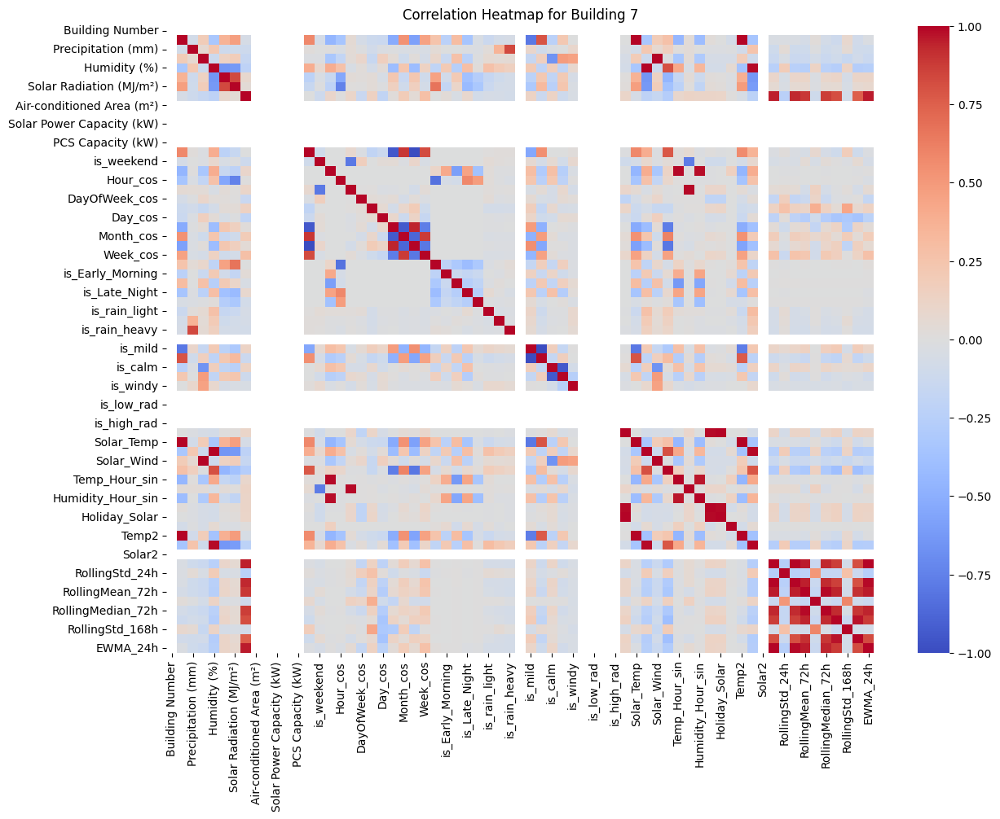

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
building_number = 7
# Filtered dataset for the selected building
bld_train = train[train['Building Number'] == building_number]

# Select only numeric columns for correlation
numeric_cols = bld_train.select_dtypes(include=['float64', 'int64'])

# Compute correlation matrix
corr_matrix = numeric_cols.corr()

# Display top correlations with the target variable
target_corr = corr_matrix['Power Consumption (kWh)'].sort_values(ascending=False)
print("\nTop correlations with Power Consumption:")
print(target_corr)

# === Heatmap Visualization ===
plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix, annot=False, cmap="coolwarm", center=0)
plt.title(f"Correlation Heatmap for Building {building_number}")
plt.show()


In [15]:
train.columns

Index(['num_date_time', 'Building Number', 'Datetime', 'Temperature (°C)',
       'Precipitation (mm)', 'Wind Speed (m/s)', 'Humidity (%)',
       'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)',
       'Power Consumption (kWh)', 'Hour', 'Day', 'Air-conditioned Area (m²)',
       'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)',
       'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)', 'DayOfWeek', 'Month',
       'Week', 'is_weekend', 'Hour_sin', 'Hour_cos', 'DayOfWeek_sin',
       'DayOfWeek_cos', 'Day_sin', 'Day_cos', 'Month_sin', 'Month_cos',
       'Week_sin', 'Week_cos', 'is_Daytime', 'is_Early_Morning', 'is_Evening',
       'is_Late_Night', 'is_Night', 'is_rain_light', 'is_rain_moderate',
       'is_rain_heavy', 'is_cold', 'is_mild', 'is_hot', 'is_calm', 'is_breezy',
       'is_windy', 'is_stormy', 'is_low_rad', 'is_medium_rad', 'is_high_rad',
       'is_holiday', 'Solar_Temp', 'Solar_Humidity', 'Solar_Wind',
       'Temp_Humidity', 'Temp_Hour_sin', 'Tem

In [16]:
train = train.replace('NaN', 0)

In [49]:
# -------------------------
# Step 0 — Imports
# -------------------------
import numpy as np
import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV, train_test_split
from joblib import Parallel, delayed

# -------------------------
# Step 1 — Error Functions
# -------------------------
def safe_mape(y_true, y_pred, epsilon=1e-3):
    numerator = np.abs(y_true - y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2 + epsilon
    return np.mean(numerator / denominator) * 100

def simple_mape(y_true, y_pred, epsilon=1e-3):
    return np.mean(np.abs((y_true - y_pred) / (y_true + epsilon))) * 100

# -------------------------
# Step 2 — Hyperparameter Grid
# -------------------------
param_grid = {
    'n_estimators': [300, 500, 700],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 8, 12],
    'subsample': [0.8],
    'colsample_bytree': [0.8]
}

# -------------------------
# Step 3 — Features & Target
# -------------------------
FEATURES = ['Building Number','Total Floor Area (m²)', 'Air-conditioned Area (m²)', 
            'is_weekend', 'is_Daytime', 'is_Early_Morning', 'is_Evening', 'is_Late_Night', 'is_Night',
            'Wind Speed (m/s)', 'Precipitation (mm)', 'ESS Storage Capacity (kWh)', 'Solar Power Capacity (kW)',
            'DayOfWeek_sin', 'DayOfWeek_cos', 'is_holiday',
            'Solar_Temp', 'Solar_Humidity', 'Solar_Wind', 'Temp_Humidity',
            'Temp_Hour_sin', 'Temp_Day_sin', 'Humidity_Hour_sin', 'Holiday_Temp',
            'Holiday_Solar', 'Holiday_Hour', 'Temp2', 'Humidity2', 
            'Hour_sin', 'Hour_cos', 
                   ]
TARGET = "Power Consumption (kWh)"

# -------------------------
# Step 4 — Training Function per Building (with train/validation split)
# -------------------------
# -------------------------
# Step 4 — Training Function per Building (with train/validation split)
# -------------------------
def train_building_with_metrics(bld):
    print(f"🔹 Training with GridSearch for Building {bld}...")
    
    # Filter train data for this building
    bld_data = train[train["Building Number"] == bld].copy()
    
    # --- Add 1-hour lag feature ---
    bld_data['lag1h'] = bld_data[TARGET].shift(1)
    
    # --- Add 24-hour rolling mean of lag1h ---
    bld_data['roll_24h'] = bld_data['lag1h'].rolling(24).mean()
    
    # Drop rows with NaN from lag or rolling
    bld_data = bld_data.dropna(subset=['lag1h', 'roll_24h'])
    
    # Train/validation split
    X = bld_data[FEATURES + ['lag1h', 'roll_24h']]  # Include lag1h and roll_24h
    y = bld_data[TARGET]
    X_train, X_val, y_train, y_val = train_test_split(
        X, y, test_size=0.2, random_state=42, shuffle=True
    )
    
    # Base model
    model = lgb.LGBMRegressor(random_state=42)
    
    # GridSearchCV
    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        cv=3,
        scoring='neg_mean_absolute_error',
        n_jobs=-1,
        verbose=0
    )
    grid_search.fit(X_train, y_train)
    
    # Best model & predictions
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_val)
    
    smape_score = safe_mape(y_val.values, y_pred)
    mape_score = simple_mape(y_val.values, y_pred)
    
    print(f"✅ Building {bld} | Best Params: {grid_search.best_params_} | SMAPE: {smape_score:.2f}% | MAPE: {mape_score:.2f}%")
    
    return bld, best_model, smape_score, mape_score, (X_val, y_val, y_pred)


# -------------------------
# Step 5 — Parallel Training
# -------------------------
results = Parallel(n_jobs=-1)(
    delayed(train_building_with_metrics)(bld) for bld in train["Building Number"].unique()
)

# -------------------------
# Step 6 — Store Results
# -------------------------
models = {}
metrics = {}
validation_predictions = {}

for bld, model, smape_score, mape_score, val_data in results:
    models[bld] = model
    metrics[bld] = {'SMAPE': smape_score, 'MAPE': mape_score}
    validation_predictions[bld] = val_data  # tuple of (X_val, y_val, y_pred)

# -------------------------
# Step 7 — Metrics Summary
# -------------------------
metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
metrics_df = metrics_df.sort_values('SMAPE')
print("Top 10 Buildings by SMAPE on Validation Split:")
print(metrics_df.head(10))

print("\nFull Metrics per Building:")
print(metrics_df)


Top 10 Buildings by SMAPE on Validation Split:
       SMAPE          MAPE
35  0.155319  1.553424e-01
36  0.266613  2.667134e-01
56  0.385656  3.856173e-01
51  0.444625  4.445726e-01
30  0.538826  9.865163e-01
57  0.700662  7.007787e-01
20  0.767655  7.688124e-01
76  0.804730  8.003489e-01
81  0.893499  8.921942e-01
52  1.092308  1.096478e+06

Full Metrics per Building:
        SMAPE           MAPE
35   0.155319       0.155342
36   0.266613       0.266713
56   0.385656       0.385617
51   0.444625       0.444573
30   0.538826       0.986516
..        ...            ...
25   6.092447  390042.605798
1    6.372664       6.544780
70   6.613891  372934.969177
23   7.191174       7.670374
100  8.026137       8.335994

[98 rows x 2 columns]


In [25]:
train.columns

Index(['num_date_time', '건물번호', '일시', '기온(°C)', '강수량(mm)', '풍속(m/s)', '습도(%)',
       '일조(hr)', '일사(MJ/m2)', '전력소비량(kWh)'],
      dtype='object')

In [18]:
metrics_df.to_csv('building_metrics.csv', index_label='Building Number')

In [ ]:
def predict_for_building(bld, train_df, test_df, model, features):
    print(f"🔹 Predicting for Building {bld}...")

    # Filter building-specific data
    bld_train = train_df[train_df["Building Number"] == bld].copy()
    bld_test = test_df[test_df["Building Number"] == bld].copy()

    if bld_test.empty:
        print(f"⚠️ No test data for Building {bld}, skipping...")
        return None

    # Sort by datetime for autoregression
    bld_test = bld_test.sort_values("Datetime").reset_index(drop=True)

    # Initialize lag1h with last known value from training
    last_train_value = bld_train[TARGET].iloc[-1]
    bld_test['lag1h'] = np.nan
    bld_test.loc[0, 'lag1h'] = last_train_value

    # Initialize roll_24h with last 24 hours from training if available
    if len(bld_train) >= 24:
        last_24h = bld_train[TARGET].iloc[-24:].tolist()
        bld_test['roll_24h'] = np.nan
        for i in range(len(bld_test)):
            if i < 24:
                # Fill first 24 hours using last training values
                bld_test.loc[i, 'roll_24h'] = np.mean(last_24h[i:])
    else:
        bld_test['roll_24h'] = np.nan

    preds = []

    # Autoregressive prediction loop
    for i in range(len(bld_test)):
        # Current features
        row_features = bld_test.loc[i, features + ['lag1h', 'roll_24h']].values.reshape(1, -1)

        # Predict
        pred = model.predict(row_features)[0]
        preds.append(pred)

        # Update lag1h for next row
        if i < len(bld_test) - 1:
            bld_test.loc[i + 1, 'lag1h'] = pred

        # Update roll_24h for next 24 rows
        for j in range(1, 25):
            if i + j < len(bld_test):
                # Compute rolling mean over previous 24 predictions
                prev_vals = preds[max(0, i - 23 + j): i + j + 1]  # last up to 24 predictions
                bld_test.loc[i + j, 'roll_24h'] = np.mean(prev_vals)

    bld_test['Predicted Power Consumption (kWh)'] = preds
    return bld_test[['Building Number', 'Datetime', 'Predicted Power Consumption (kWh)']]


In [51]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

# -------------------------
# CONFIG
# -------------------------
TARGET = "Power Consumption (kWh)"
OUTPUT_FILE = "final_test_predictions.csv"

# Your trained models from previous step
# models = {bld: trained_lightgbm_model, ...}

# -------------------------
# FUNCTION TO FIX DTYPES
# -------------------------
def fix_dtypes(df):
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = pd.to_numeric(df[col], errors='coerce')
    return df

# -------------------------
# FUNCTION TO PREDICT FOR A SINGLE BUILDING
# -------------------------
def predict_for_building(bld, train_df, test_df, model, features):
    print(f"🔹 Predicting for Building {bld}...")

    # Filter building-specific data
    bld_train = train_df[train_df["Building Number"] == bld].copy()
    bld_test = test_df[test_df["Building Number"] == bld].copy()

    if bld_test.empty:
        print(f"⚠️ No test data for Building {bld}, skipping...")
        return None

    # Sort by datetime for autoregression
    bld_test = bld_test.sort_values("Datetime").reset_index(drop=True)

    # Initialize lag1h with last known value from training
    last_train_value = bld_train[TARGET].iloc[-1]
    bld_test['lag1h'] = np.nan
    bld_test.loc[0, 'lag1h'] = last_train_value

    # Initialize roll_24h with last 24 hours from training if available
    if len(bld_train) >= 24:
        last_24h = bld_train[TARGET].iloc[-24:].tolist()
        bld_test['roll_24h'] = np.nan
        for i in range(len(bld_test)):
            if i < 24:
                # Fill first 24 hours using last training values
                bld_test.loc[i, 'roll_24h'] = np.mean(last_24h[i:])
    else:
        bld_test['roll_24h'] = np.nan

    preds = []

    # Autoregressive prediction loop
    for i in range(len(bld_test)):
        # Current features
        row_features = bld_test.loc[i, features + ['lag1h', 'roll_24h']].values.reshape(1, -1)

        # Predict
        pred = model.predict(row_features)[0]
        preds.append(pred)

        # Update lag1h for next row
        if i < len(bld_test) - 1:
            bld_test.loc[i + 1, 'lag1h'] = pred

        # Update roll_24h for next 24 rows
        for j in range(1, 25):
            if i + j < len(bld_test):
                # Compute rolling mean over previous 24 predictions
                prev_vals = preds[max(0, i - 23 + j): i + j + 1]  # last up to 24 predictions
                bld_test.loc[i + j, 'roll_24h'] = np.mean(prev_vals)

    bld_test['Predicted Power Consumption (kWh)'] = preds
    return bld_test[['Building Number', 'Datetime', 'Predicted Power Consumption (kWh)']]

# -------------------------
# MAIN TESTING PIPELINE
# -------------------------
def generate_test_predictions(train_df, test_df, models, features):
    all_predictions = []

    for bld in test_df["Building Number"].unique():
        if bld not in models:
            print(f"⚠️ No trained model for Building {bld}, skipping...")
            continue

        bld_preds = predict_for_building(bld, train_df, test_df, models[bld], features)
        if bld_preds is not None:
            all_predictions.append(bld_preds)

    # Combine all buildings' predictions
    final_predictions = pd.concat(all_predictions, ignore_index=True)
    final_predictions.to_csv(OUTPUT_FILE, index=False)
    return final_predictions

# -------------------------
# LOAD DATA
# -------------------------


# Fix dtypes for numeric processing
train = fix_dtypes(train)
test = fix_dtypes(test)

# -------------------------
# GENERATE PREDICTIONS
# -------------------------
final_predictions = generate_test_predictions(train, test, models, FEATURES)

print("✅ Final predictions generated and saved!")
print(final_predictions.head())


🔹 Predicting for Building 1...
🔹 Predicting for Building 2...
🔹 Predicting for Building 3...
🔹 Predicting for Building 4...
🔹 Predicting for Building 5...
🔹 Predicting for Building 6...
⚠️ No trained model for Building 7, skipping...
🔹 Predicting for Building 8...
🔹 Predicting for Building 9...
🔹 Predicting for Building 10...
🔹 Predicting for Building 11...
🔹 Predicting for Building 12...
🔹 Predicting for Building 13...
🔹 Predicting for Building 14...
🔹 Predicting for Building 15...
🔹 Predicting for Building 16...
🔹 Predicting for Building 17...
🔹 Predicting for Building 18...
🔹 Predicting for Building 19...
🔹 Predicting for Building 20...
🔹 Predicting for Building 21...
🔹 Predicting for Building 22...
🔹 Predicting for Building 23...
🔹 Predicting for Building 24...
🔹 Predicting for Building 25...
⚠️ No trained model for Building 26, skipping...
🔹 Predicting for Building 27...
🔹 Predicting for Building 28...
🔹 Predicting for Building 29...
🔹 Predicting for Building 30...
🔹 Predicting fo

In [44]:
import pandas as pd

# === Load the main and separate building predictions ===
main_predictions = pd.read_csv("final_test_predictions.csv")
building_7_preds = pd.read_csv("building_7_predictions.csv")
building_26_preds = pd.read_csv("building_26_predictions.csv")

# === Merge everything into one dataframe ===
final_predictions = pd.concat([main_predictions, building_7_preds, building_26_preds], ignore_index=True)

# === Ensure Datetime column is in datetime format ===
final_predictions["Datetime"] = pd.to_datetime(final_predictions["Datetime"])

# === Extract date and hour separately ===
final_predictions["date_str"] = final_predictions["Datetime"].dt.strftime("%Y%m%d")
final_predictions["hour_str"] = final_predictions["Datetime"].dt.strftime("%H")

# === Create the num_date_time column ===
final_predictions["num_date_time"] = final_predictions["Building Number"].astype(str) + "_" + final_predictions["date_str"] + " " + final_predictions["hour_str"]

# === Rename prediction column to 'answer' ===
# Replace 'Predicted' with your actual prediction column name if different
final_predictions = final_predictions.rename(columns={"Predicted Power Consumption (kWh)": "answer"})

# === Keep only required columns ===
submission_df = final_predictions[["num_date_time", "answer"]]

# === Sort by num_date_time ===
submission_df = submission_df.sort_values(by="num_date_time").reset_index(drop=True)

# === Save the final submission CSV ===
submission_df.to_csv("final_submission.csv", index=False)

print("✅ Submission file saved as 'final_submission.csv'")
print(submission_df.head())


✅ Submission file saved as 'final_submission.csv'
     num_date_time       answer
0  100_20240825 00  2816.460741
1  100_20240825 01  2788.607791
2  100_20240825 02  2745.195616
3  100_20240825 03  2624.693209
4  100_20240825 04  2383.934240


In [52]:
import pandas as pd

# === Step 1: Read prediction files ===
main_preds = pd.read_csv("final_test_predictions.csv")
bld7_preds = pd.read_csv("building_7_predictions.csv")
bld26_preds = pd.read_csv("building_26_predictions.csv")

# === Step 2: Concatenate all predictions ===
all_preds = pd.concat([main_preds, bld7_preds, bld26_preds], ignore_index=True)

# === Step 3: Convert Datetime to proper datetime if needed ===
# Assuming there is a 'Datetime' column in the format 'YYYY-MM-DD HH:MM:SS'
if 'Datetime' in all_preds.columns:
    all_preds['Datetime'] = pd.to_datetime(all_preds['Datetime'])
else:
    # If your column is named differently in files, adjust accordingly
    all_preds['Datetime'] = pd.to_datetime(all_preds['num_date_time'], format="%Y%m%d %H")

# === Step 4: Sort by Building Number and Datetime ===
all_preds = all_preds.sort_values(["Building Number", "Datetime"]).reset_index(drop=True)

# === Step 5: Map building numbers to sequential IDs starting from 1 ===
unique_buildings = sorted(all_preds["Building Number"].unique())
building_map = {b: i+1 for i, b in enumerate(unique_buildings)}
all_preds["Building_ID"] = all_preds["Building Number"].map(building_map)

# === Step 6: Create num_date_time in required format ===
all_preds["num_date_time"] = all_preds["Building_ID"].astype(str) + "_" + all_preds["Datetime"].dt.strftime("%Y%m%d %H")

# === Step 7: Rename prediction column to 'answer' and select required columns ===
all_preds = all_preds.rename(columns={"Predicted Power Consumption (kWh)": "answer"})
submission_df = all_preds[["num_date_time", "answer"]]

# === Step 8: Save final submission ===
submission_df.to_csv("final_submission1.csv", index=False)

print("Submission file saved as 'final_submission2.csv'")
print(submission_df.head(10))


Submission file saved as 'final_submission2.csv'
   num_date_time       answer
0  1_20240825 00  4690.157557
1  1_20240825 01  4872.313437
2  1_20240825 02  4676.673198
3  1_20240825 03  4590.399854
4  1_20240825 04  4674.735705
5  1_20240825 05  4770.291145
6  1_20240825 06  4869.630908
7  1_20240825 07  5056.534345
8  1_20240825 08  5408.067859
9  1_20240825 09  5908.735562


In [42]:
smp.head()

,num_date_time,answer
0,1_20240825 00,0
1,1_20240825 01,0
2,1_20240825 02,0
3,1_20240825 03,0
4,1_20240825 04,0


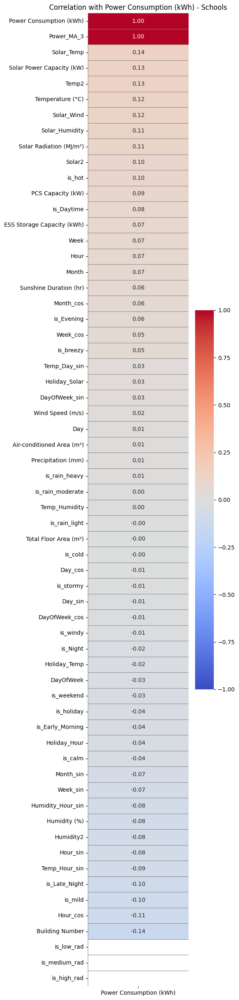

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix (numeric only)
corr_matrix = train.corr(numeric_only=True)

# Select the row of correlations with 'Power Consumption (kWh)'
corr_with_power = corr_matrix[['Power Consumption (kWh)']].sort_values(by='Power Consumption (kWh)', ascending=False)

plt.figure(figsize=(4, len(corr_with_power)*0.5))  # Adjust height to number of features

sns.heatmap(
    corr_with_power,
    annot=True,
    cmap='coolwarm',
    vmin=-1, vmax=1,
    cbar=True,
    linewidths=0.5,
    linecolor='gray',
    fmt=".2f"
)

plt.title('Correlation with Power Consumption (kWh) - Schools')
plt.show()


In [17]:
train.head()

,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Power Consumption (kWh),...,RollingMean_24h,RollingStd_24h,RollingMedian_24h,RollingMean_72h,RollingStd_72h,RollingMedian_72h,RollingMean_168h,RollingStd_168h,RollingMedian_168h,EWMA_24h
0,1_20240601 00,1,2024-06-01 00:00:00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1_20240601 01,1,2024-06-01 01:00:00,18.3,0.0,2.7,82.0,0.0,0.0,5591.85,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5794.800000
2,1_20240601 02,1,2024-06-01 02:00:00,18.1,0.0,2.6,80.0,0.0,0.0,5338.17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5778.564000
3,1_20240601 03,1,2024-06-01 03:00:00,18.0,0.0,2.6,81.0,0.0,0.0,4554.42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5743.332480
4,1_20240601 04,1,2024-06-01 04:00:00,17.8,0.0,1.3,81.0,0.0,0.0,3602.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5648.219482


In [16]:
train_school = train[train['Building Type'] == 'School']


# train_com = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'[
#     'is_Daytime', 'is_Late_Night',
#     'is_Early_Morning', 'is_Night', 'is_Evening',
#     'Wind Speed (m/s)', 
#     'Precipitation (mm)',
#     'DayOfWeek_sin', 'DayOfWeek_cos','Solar_Temp', 
#     'Solar_Humidity', 'Temp_Humidity', 'Temp_Hour_sin', 
#     'Temp_Day_sin', 'Humidity_Hour_sin',
#     'Hour_sin', 'Hour_cos', 
#   # <--- Added moving average feature
# ]
# # )
train_com = train[train['Building Type'] == 'Commercial']

# train_hospital = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_hospital = train[train['Building Type'] == 'Hospital']

# train_other = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_other = train[train['Building Type'] == 'Other Building']

# train_apartment = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_apartment = train[train['Building Type'] == 'Apartment']

# train_research = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_research = train[train['Building Type'] == 'Research Institute']

# train_department = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_department = train[train['Building Type'] == 'Department Store']

# train_idc = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_idc = train[train['Building Type'] == 'IDC (Telecom Center)']

# train_public = train.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)', 'Building Type']],
#     on='Building Number',
#     how='left'
# )
train_public = train[train['Building Type'] == 'Public Facility']

train_hotel = train[train['Building Type'] == 'Hotel']

test_school = test[test['Building Type'] == 'School']

# test_com = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_com = test[test['Building Type'] == 'Commercial']

# test_hospital = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_hospital = test[test['Building Type'] == 'Hospital']

# test_other = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_other = test[test['Building Type'] == 'Other Building']

# test_apartment = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_apartment = test[test['Building Type'] == 'Apartment']

# test_research = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_research = test[test['Building Type'] == 'Research Institute']

# test_department = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_department = test[test['Building Type'] == 'Department Store']

# test_idc = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_idc = test[test['Building Type'] == 'IDC (Telecom Center)']

# test_public = test.merge(
#     bld[['Building Number', 'Total Floor Area (m²)', 'Air-conditioned Area (m²)','Building Type']],
#     on='Building Number',
#     how='left'
# )
test_public = test[test['Building Type'] == 'Public Facility']

test_hotel = test[test['Building Type'] == 'Hotel']


In [17]:
train.columns

Index(['num_date_time', 'Building Number', 'Datetime', 'Temperature (°C)',
       'Precipitation (mm)', 'Wind Speed (m/s)', 'Humidity (%)',
       'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)',
       'Power Consumption (kWh)', 'Hour', 'Day', 'Air-conditioned Area (m²)',
       'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)',
       'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)', 'DayOfWeek', 'Month',
       'Week', 'is_weekend', 'Hour_sin', 'Hour_cos', 'DayOfWeek_sin',
       'DayOfWeek_cos', 'Day_sin', 'Day_cos', 'Month_sin', 'Month_cos',
       'Week_sin', 'Week_cos', 'is_Daytime', 'is_Early_Morning', 'is_Evening',
       'is_Late_Night', 'is_Night', 'is_rain_light', 'is_rain_moderate',
       'is_rain_heavy', 'is_cold', 'is_mild', 'is_hot', 'is_calm', 'is_breezy',
       'is_windy', 'is_stormy', 'is_low_rad', 'is_medium_rad', 'is_high_rad',
       'is_holiday', 'Solar_Temp', 'Solar_Humidity', 'Solar_Wind',
       'Temp_Humidity', 'Temp_Hour_sin', 'Tem

In [18]:
test.columns

Index(['num_date_time', 'Building Number', 'Datetime', 'Temperature (°C)',
       'Precipitation (mm)', 'Wind Speed (m/s)', 'Humidity (%)',
       'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)', 'Hour', 'Day',
       'Air-conditioned Area (m²)', 'Total Floor Area (m²)', 'Building Type',
       'Solar Power Capacity (kW)', 'ESS Storage Capacity (kWh)',
       'PCS Capacity (kW)', 'DayOfWeek', 'Month', 'Week', 'is_weekend',
       'Hour_sin', 'Hour_cos', 'DayOfWeek_sin', 'DayOfWeek_cos', 'Day_sin',
       'Day_cos', 'Month_sin', 'Month_cos', 'Week_sin', 'Week_cos',
       'is_Daytime', 'is_Early_Morning', 'is_Evening', 'is_Late_Night',
       'is_Night', 'is_rain_light', 'is_rain_moderate', 'is_rain_heavy',
       'is_cold', 'is_mild', 'is_hot', 'is_calm', 'is_breezy', 'is_windy',
       'is_stormy', 'is_low_rad', 'is_medium_rad', 'is_high_rad', 'is_holiday',
       'Solar_Temp', 'Solar_Humidity', 'Solar_Wind', 'Temp_Humidity',
       'Temp_Hour_sin', 'Temp_Day_sin', 'Humidity_Hour_

In [17]:
features = ['Building Number','Total Floor Area (m²)', 'Air-conditioned Area (m²)', 
            'is_weekend', 'is_Daytime', 'is_Early_Morning', 'is_Evening', 'is_Late_Night', 'is_Night',
            'Wind Speed (m/s)', 'Precipitation (mm)', 'ESS Storage Capacity (kWh)', 'Solar Power Capacity (kW)',
            'DayOfWeek_sin', 'DayOfWeek_cos', 'is_holiday',
            'Solar_Temp', 'Solar_Humidity', 'Solar_Wind', 'Temp_Humidity',
            'Temp_Hour_sin', 'Temp_Day_sin', 'Humidity_Hour_sin', 'Holiday_Temp',
            'Holiday_Solar', 'Holiday_Hour', 'Temp2', 'Humidity2', 
            'Hour_sin', 'Hour_cos', 
                   ]

C:\Users\Dell\AppData\Local\Temp\ipykernel_30032\3763282294.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_school["Datetime"] = pd.to_datetime(train_school["Datetime"])
C:\Users\Dell\AppData\Local\Temp\ipykernel_30032\3763282294.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_school["Hour"] = train_school["Datetime"].dt.hour
C:\Users\Dell\AppData\Local\Temp\ipykernel_30032\3763282294.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

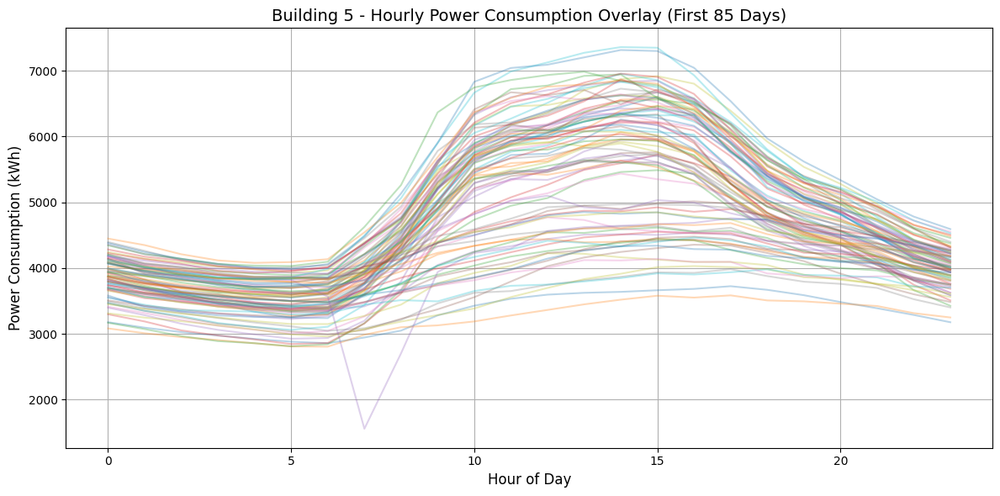

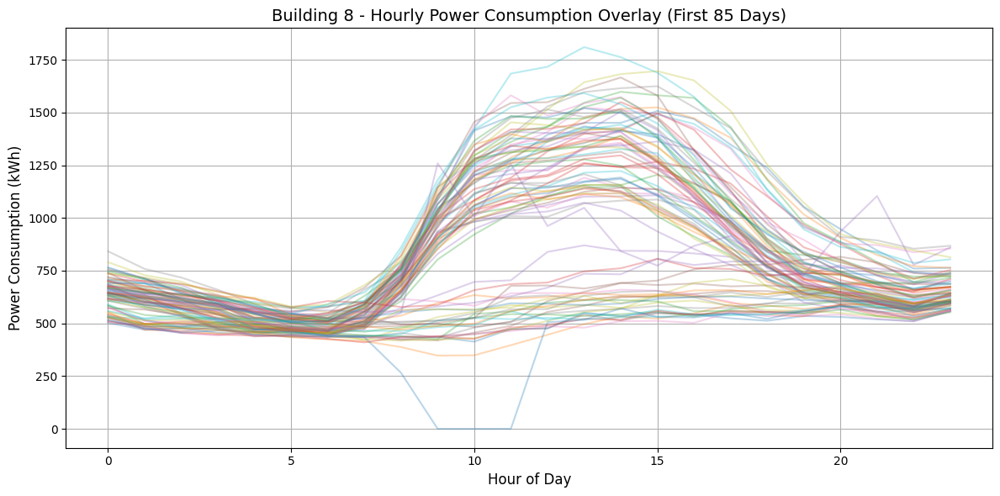

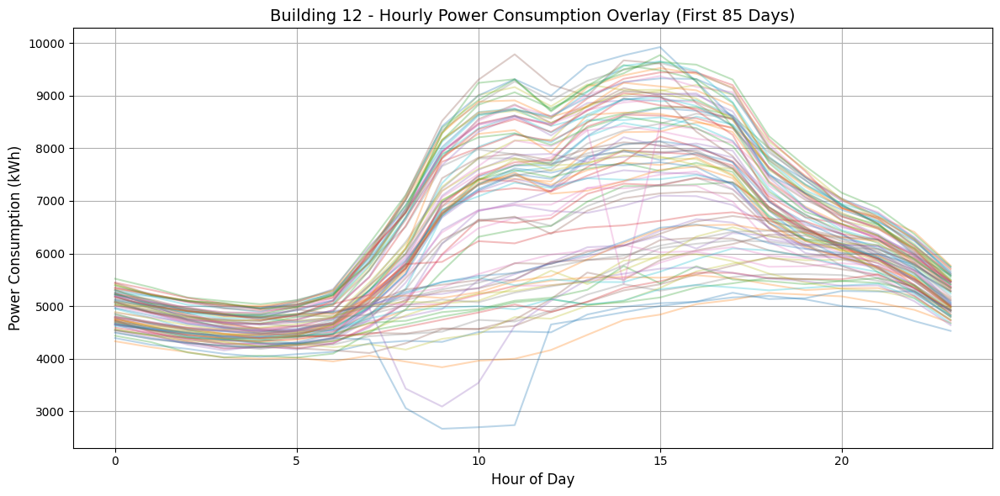

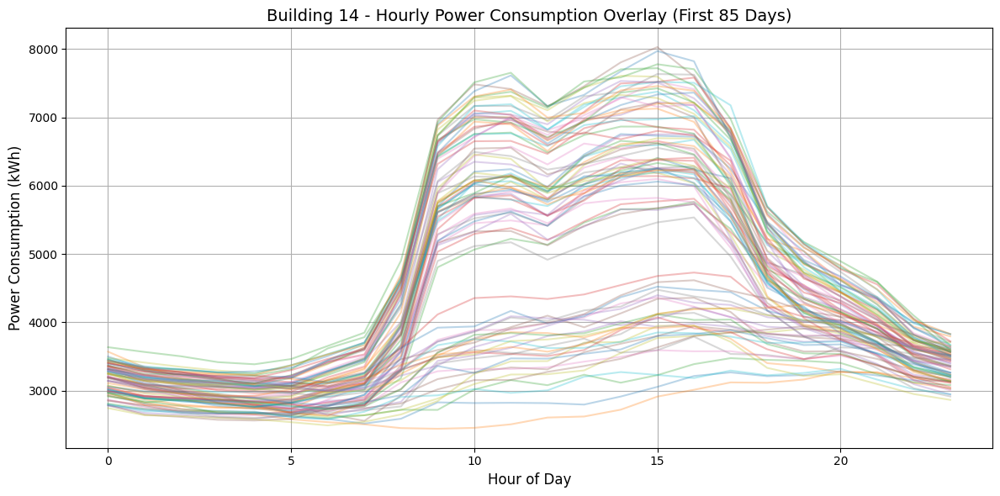

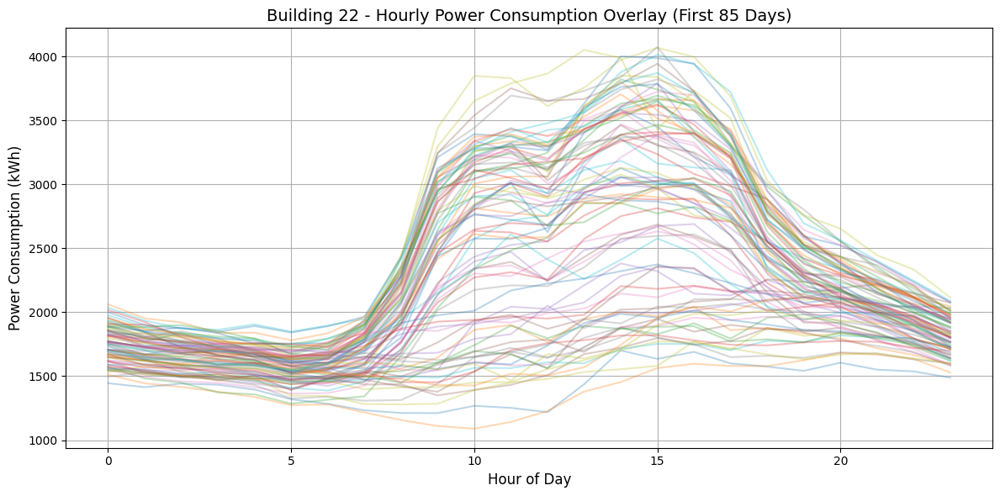

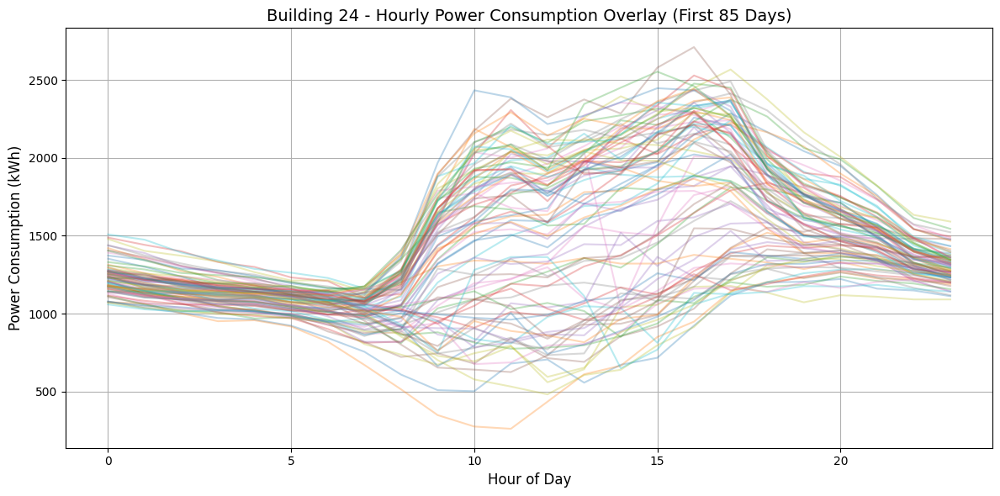

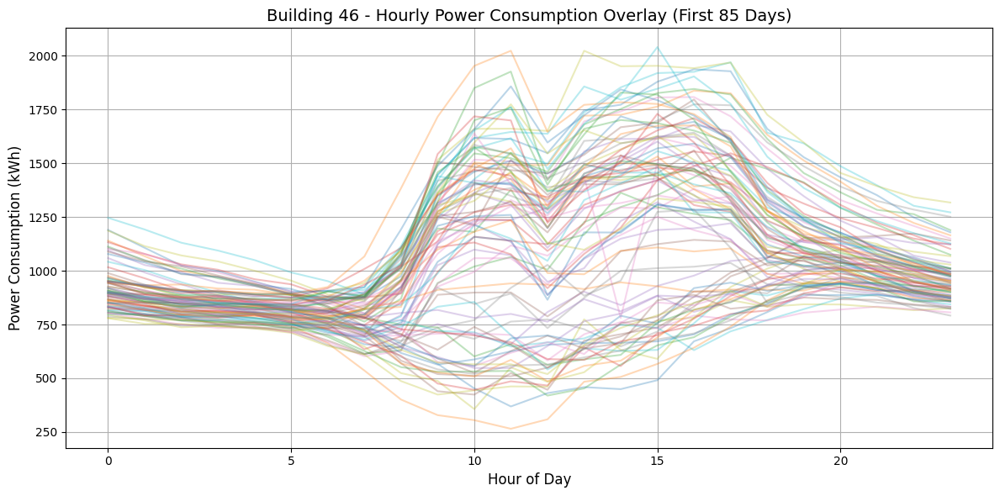

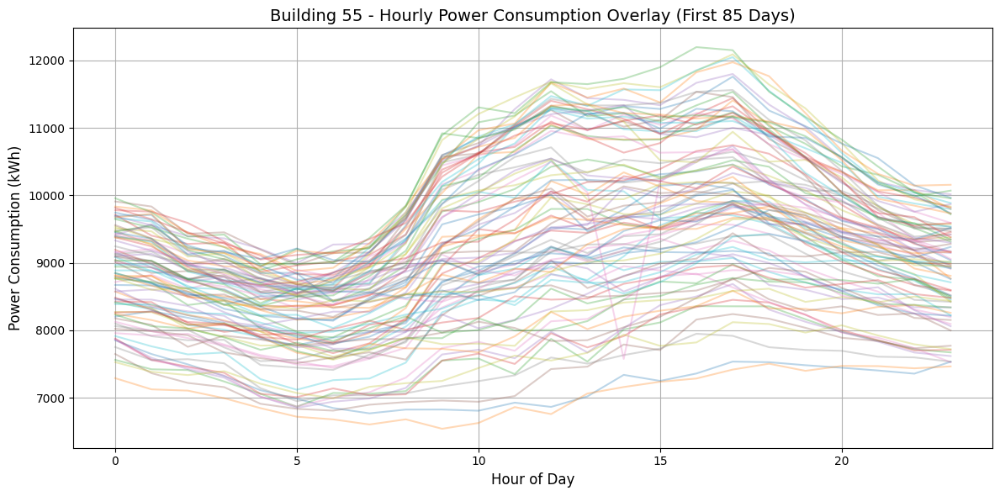

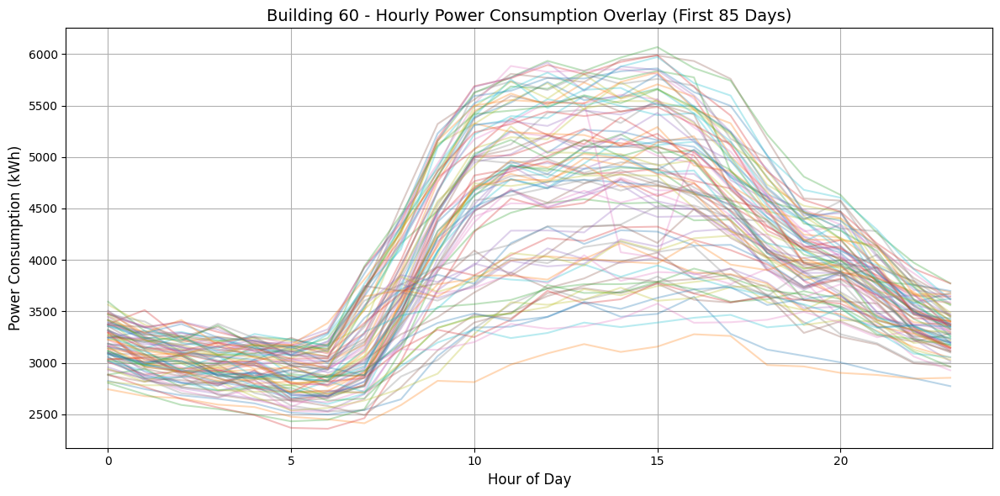

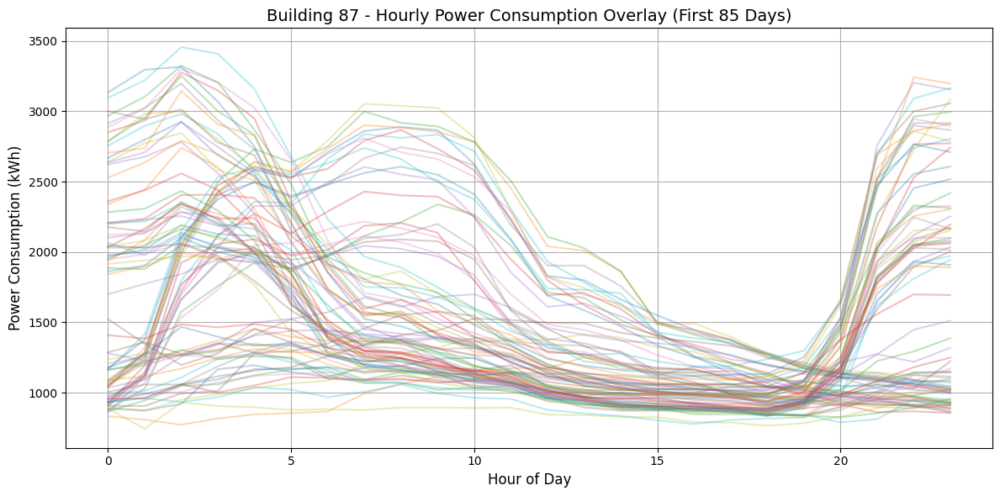

In [30]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure datetime column is proper
train_school["Datetime"] = pd.to_datetime(train_school["Datetime"])
train_school["Hour"] = train_school["Datetime"].dt.hour
train_school["Date"] = train_school["Datetime"].dt.date

# Get unique buildings
buildings = sorted(train_school["Building Number"].unique())

# Plot overlayed graph for each building
for bld in buildings:
    building_df = train_school[train_school["Building Number"] == bld].copy()

    plt.figure(figsize=(12, 6))
    
    # Loop through each day and plot hourly consumption
    for date in building_df["Date"].unique():
        day_data = building_df[building_df["Date"] == date]
        plt.plot(
            day_data["Hour"],
            day_data["Power Consumption (kWh)"],
            alpha=0.3  # transparency for better overlay visibility
        )
    
    plt.title(f"Building {bld} - Hourly Power Consumption Overlay (First 85 Days)", fontsize=14)
    plt.xlabel("Hour of Day", fontsize=12)
    plt.ylabel("Power Consumption (kWh)", fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [18]:
# ===== Prepare features & target =====
X = train_school[features]

y = train_school['Power Consumption (kWh)']

# ===== Train-test split =====    
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=42)

C:\Users\Dell\AppData\Local\Temp\ipykernel_27464\811488124.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_school['after_6'] = (train_school['Hour'] >= 8).astype(int)
C:\Users\Dell\AppData\Local\Temp\ipykernel_27464\811488124.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_school['after_18'] = (train_school['Hour'] >= 16).astype(int)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2363
[LightGBM] [Info] Number of data points in the train set: 16524, number of used features: 21
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 3690.630688
LightGBM MSE: 32498.29
LightGBM RMSE: 180.27
LightGBM R2: 0.9956
LightGBM MAPE: 119765216955952656.00%
Safe MAPE (SMAPE): 4.33%
Standard MAPE: 119765216955952656.00%
Safe MAPE (SMAPE): 4.33%


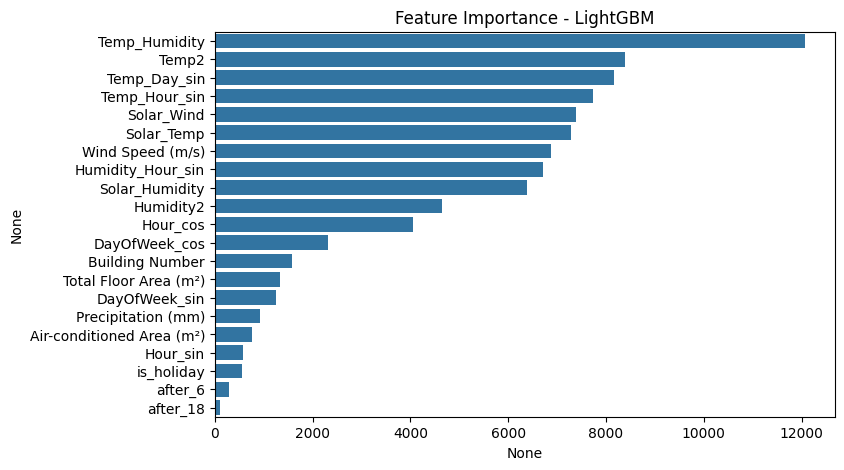

In [21]:
# Index(['num_date_time', 'Building Number', 'Datetime', 'Temperature (°C)',
#        'Precipitation (mm)', 'Wind Speed (m/s)', 'Humidity (%)',
#        'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)',
#        'Power Consumption (kWh)', 'Hour', 'Day', 'Air-conditioned Area (m²)',
#        'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)',
#        'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)', 'DayOfWeek', 'Month',
#        'Week', 'is_weekend', 'Hour_sin', 'Hour_cos', 'DayOfWeek_sin',
#        'DayOfWeek_cos', 'Day_sin', 'Day_cos', 'Month_sin', 'Month_cos',
#        'Week_sin', 'Week_cos', 'is_Afternoon', 'is_Evening', 'is_Morning',
#        'is_Night', 'is_rain_light', 'is_rain_moderate', 'is_rain_heavy',
#        'is_cold', 'is_mild', 'is_hot', 'is_calm', 'is_breezy', 'is_windy',
#        'is_stormy', 'is_low_rad', 'is_medium_rad', 'is_high_rad',
#        'RollingMean_24h', 'RollingStd_24h', 'RollingMedian_24h',
#        'RollingMean_72h', 'RollingStd_72h', 'RollingMedian_72h',
#        'RollingMean_168h', 'RollingStd_168h', 'RollingMedian_168h',
#        'EWMA_24h'],
#       dtype='object')
  
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import numpy as np

def safe_mape(y_true, y_pred, epsilon=1e-3):
    numerator = np.abs(y_true - y_pred)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2 + epsilon
    return np.mean(numerator / denominator) * 100



train_school['after_6'] = (train_school['Hour'] >= 8).astype(int)
train_school['after_18'] = (train_school['Hour'] >= 16).astype(int)
# ===== Prepare features & target =====
X = train_school[['Building Number','Total Floor Area (m²)', 'Air-conditioned Area (m²)', 
            'Wind Speed (m/s)', 'Precipitation (mm)',
            'DayOfWeek_sin', 'DayOfWeek_cos', 'is_holiday',
            'Solar_Temp', 'Solar_Humidity', 'Solar_Wind', 'Temp_Humidity',
            'Temp_Hour_sin', 'Temp_Day_sin', 'Humidity_Hour_sin', 'Temp2', 'Humidity2', 
            'Hour_sin', 'Hour_cos', 'after_6', 'after_18'
                   ]]

y = train_school['Power Consumption (kWh)']

# ===== Train-test split =====    
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=600,
    learning_rate=0.1,
    num_leaves=150,
    random_state=42
)

# Train (no 'verbose' here)
model.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")
safe_mape_value = safe_mape(y_test.values, y_pred)
print(f"Safe MAPE (SMAPE): {safe_mape_value:.2f}%")
standard_mape = mean_absolute_percentage_error(y_test, y_pred) * 100
safe_mape_value = safe_mape(y_test.values, y_pred)

print(f"Standard MAPE: {standard_mape:.2f}%")
print(f"Safe MAPE (SMAPE): {safe_mape_value:.2f}%")


# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()




In [43]:
import pandas as pd


# # Convert to datetime first
# test_school['Datetime'] = pd.to_datetime(test_school['Datetime'], format='%Y%m%d %H')

# # Now extract the hour
# test_school['Hour'] = test_school['Datetime'].dt.hour
# test_school['Day'] = test_school['Datetime'].dt.day


test_school['after_6'] = (test_school['Hour'] >= 8).astype(int)
test_school['after_18'] = (test_school['Hour'] >= 16).astype(int)
# Features for prediction — must match testing features
X_future = test_school[['Building Number','Total Floor Area (m²)', 'Air-conditioned Area (m²)', 
            'Wind Speed (m/s)', 'Precipitation (mm)',
            'DayOfWeek_sin', 'DayOfWeek_cos', 'is_holiday',
            'Solar_Temp', 'Solar_Humidity', 'Solar_Wind', 'Temp_Humidity',
            'Temp_Hour_sin', 'Temp_Day_sin', 'Humidity_Hour_sin', 'Temp2', 'Humidity2', 
            'Hour_sin', 'Hour_cos', 'after_6', 'after_18'
                   ]]
# Predict
test_school['Predicted Power Consumption (kWh)'] = model.predict(X_future)

# Save predictions
test_school.to_csv("school_predictions.csv", index=False)


C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\1242398191.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_school['after_6'] = (test_school['Hour'] >= 8).astype(int)
C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\1242398191.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_school['after_18'] = (test_school['Hour'] >= 16).astype(int)
C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\1242398191.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

In [45]:
train.columns

Index(['num_date_time', 'Building Number', 'Datetime', 'Temperature (°C)',
       'Precipitation (mm)', 'Wind Speed (m/s)', 'Humidity (%)',
       'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)',
       'Power Consumption (kWh)', 'Hour', 'Day', 'Air-conditioned Area (m²)',
       'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)',
       'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)', 'DayOfWeek', 'Month',
       'Week', 'is_weekend', 'Hour_sin', 'Hour_cos', 'DayOfWeek_sin',
       'DayOfWeek_cos', 'Day_sin', 'Day_cos', 'Month_sin', 'Month_cos',
       'Week_sin', 'Week_cos', 'is_Daytime', 'is_Early_Morning', 'is_Evening',
       'is_Late_Night', 'is_Night', 'is_rain_light', 'is_rain_moderate',
       'is_rain_heavy', 'is_cold', 'is_mild', 'is_hot', 'is_calm', 'is_breezy',
       'is_windy', 'is_stormy', 'is_low_rad', 'is_medium_rad', 'is_high_rad',
       'is_holiday', 'Solar_Temp', 'Solar_Humidity', 'Solar_Wind',
       'Temp_Humidity', 'Temp_Hour_sin', 'Tem

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\4103496772.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_com["Datetime"] = pd.to_datetime(train_com["Datetime"])
C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\4103496772.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_com["Hour"] = train_com["Datetime"].dt.hour
C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\4103496772.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

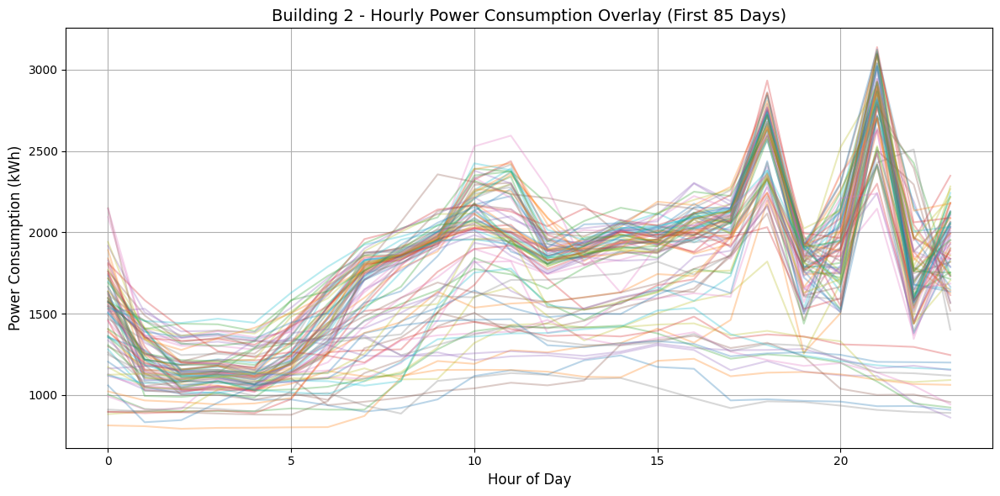

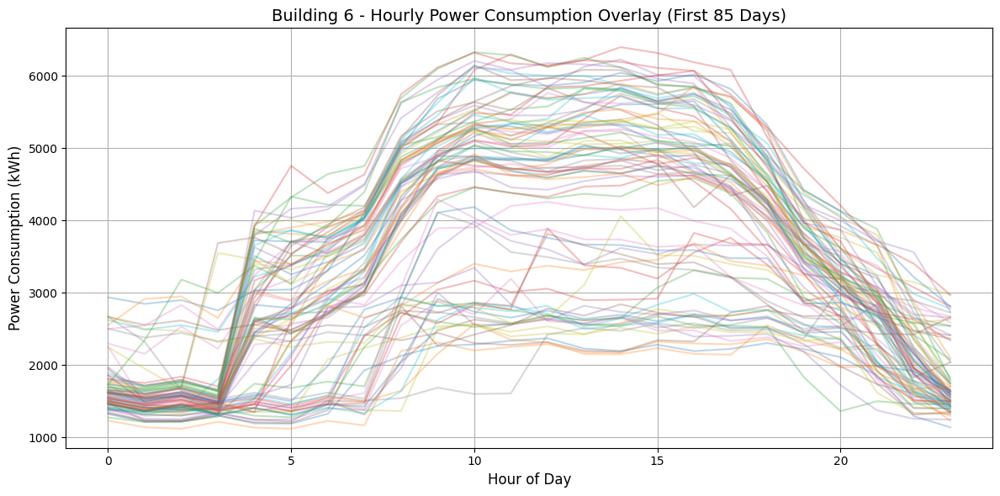

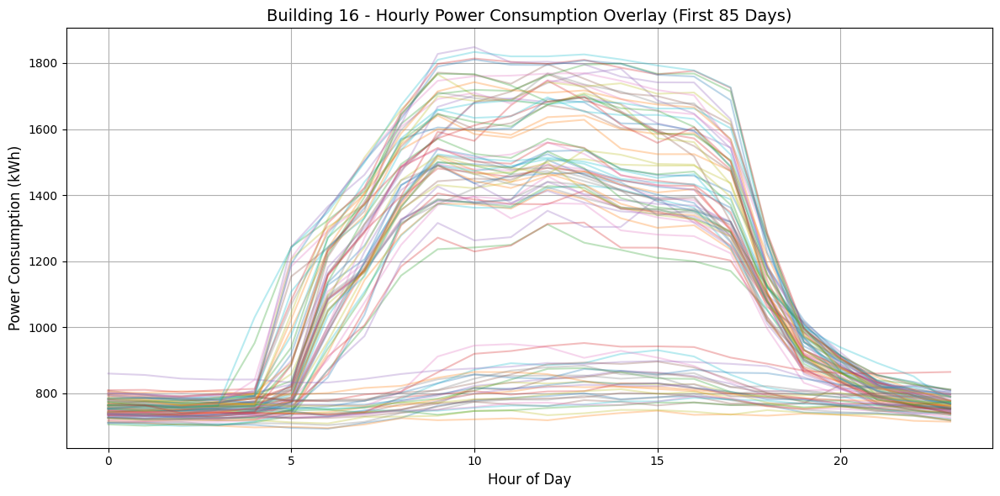

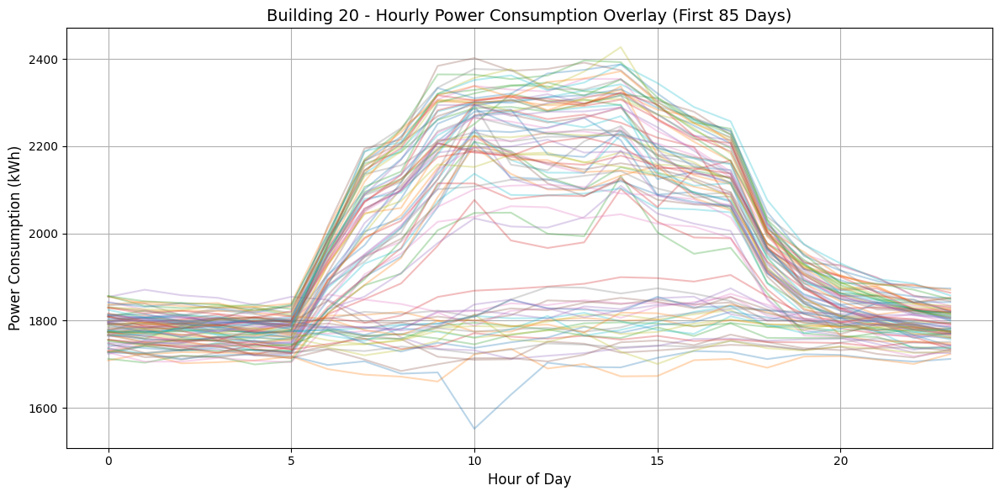

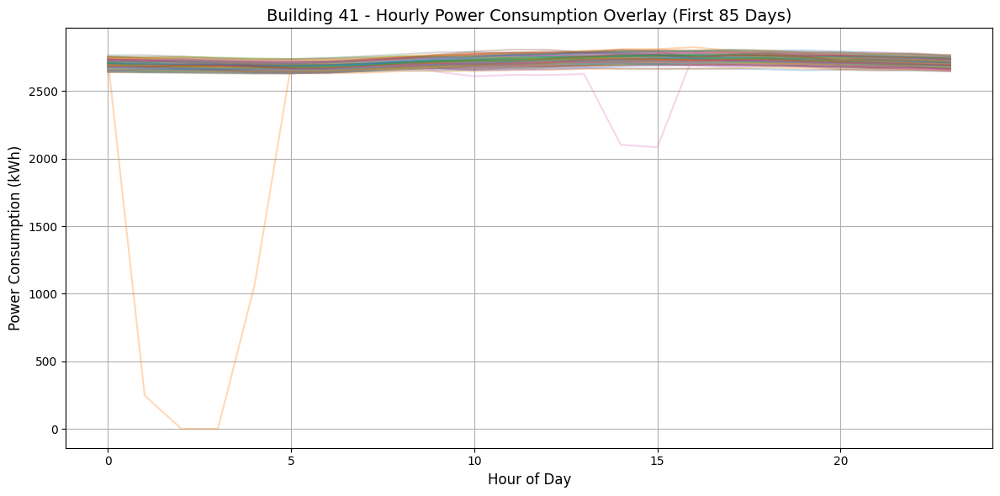

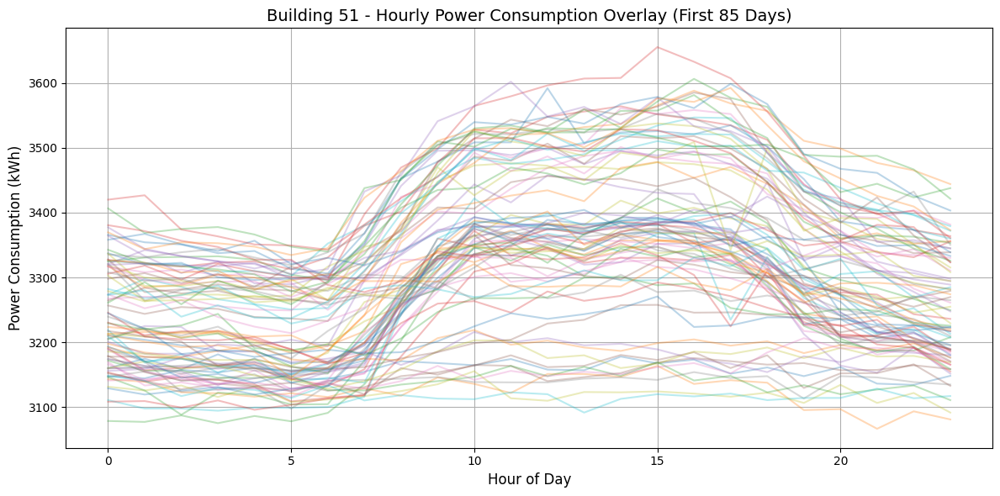

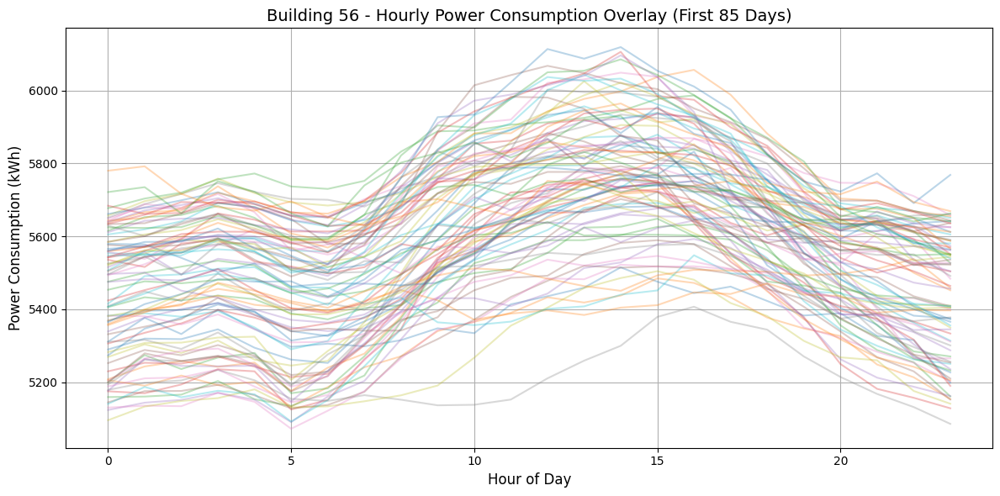

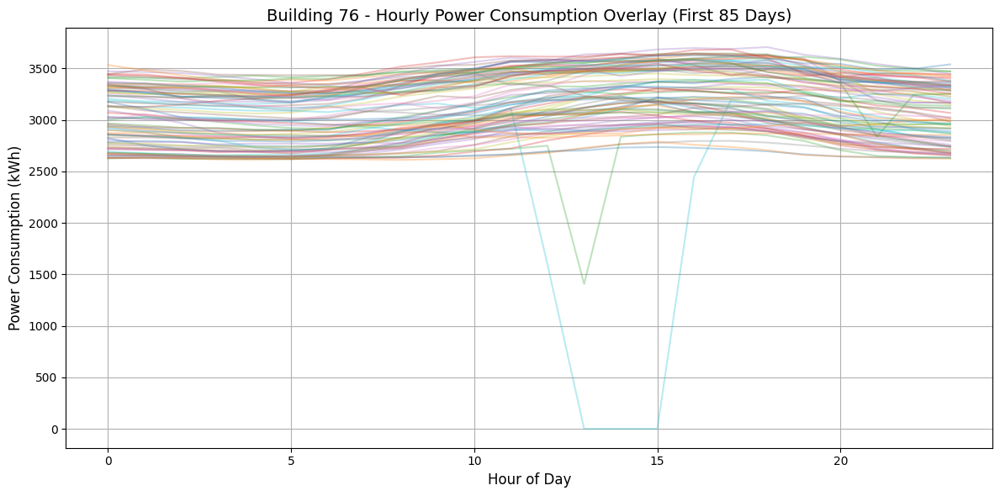

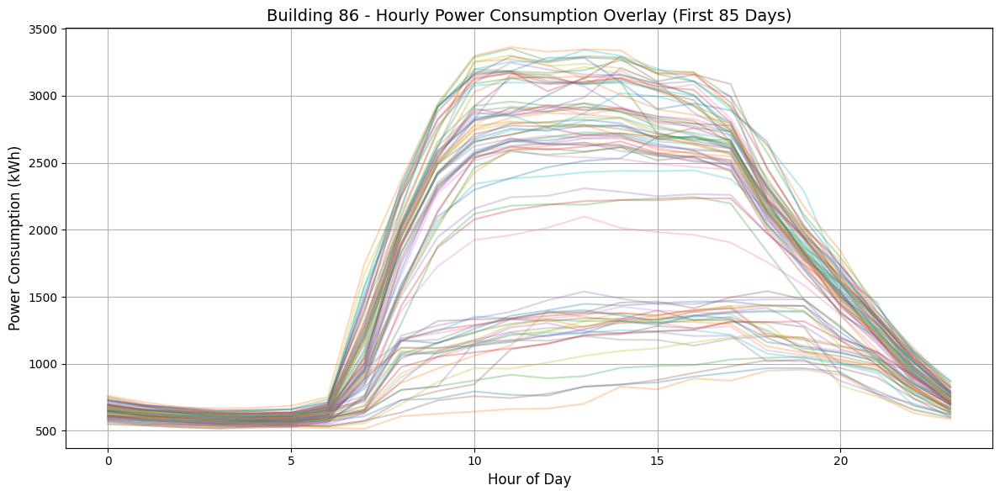

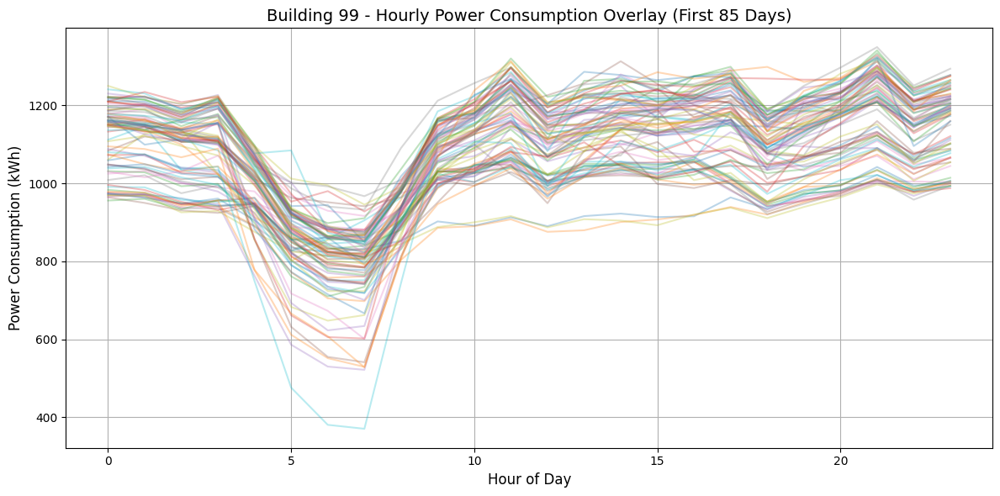

In [46]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure datetime column is proper
train_com["Datetime"] = pd.to_datetime(train_com["Datetime"])
train_com["Hour"] = train_com["Datetime"].dt.hour
train_com["Date"] = train_com["Datetime"].dt.date

# Get unique buildings
buildings = sorted(train_com["Building Number"].unique())

# Plot overlayed graph for each building
for bld in buildings:
    building_df = train_com[train_com["Building Number"] == bld].copy()

    plt.figure(figsize=(12, 6))
    
    # Loop through each day and plot hourly consumption
    for date in building_df["Date"].unique():
        day_data = building_df[building_df["Date"] == date]
        plt.plot(
            day_data["Hour"],
            day_data["Power Consumption (kWh)"],
            alpha=0.3  # transparency for better overlay visibility
        )
    
    plt.title(f"Building {bld} - Hourly Power Consumption Overlay (First 85 Days)", fontsize=14)
    plt.xlabel("Hour of Day", fontsize=12)
    plt.ylabel("Power Consumption (kWh)", fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2601
[LightGBM] [Info] Number of data points in the train set: 18360, number of used features: 28
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 2511.983457
LightGBM MSE: 11560.18
LightGBM RMSE: 107.52
LightGBM R2: 0.9945
LightGBM MAPE: 2.83%


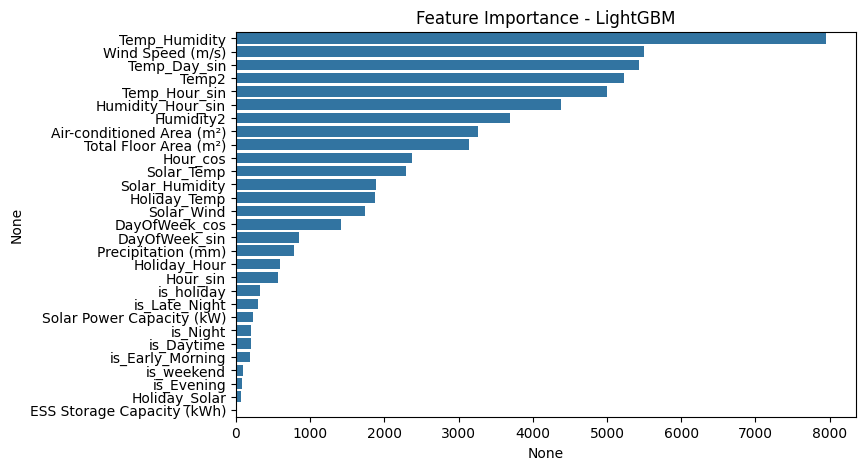

In [ ]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_com[['Building Number','Total Floor Area (m²)', 'Air-conditioned Area (m²)', 
            'is_weekend', 'is_Daytime', 'is_Early_Morning', 'is_Evening', 'is_Late_Night', 'is_Night',
            'Wind Speed (m/s)', 'Precipitation (mm)', 'ESS Storage Capacity (kWh)', 'Solar Power Capacity (kW)',
            'DayOfWeek_sin', 'DayOfWeek_cos', 'is_holiday',
            'Solar_Temp', 'Solar_Humidity', 'Solar_Wind', 'Temp_Humidity',
            'Temp_Hour_sin', 'Temp_Day_sin', 'Humidity_Hour_sin', 'Holiday_Temp',
            'Holiday_Solar', 'Holiday_Hour', 'Temp2', 'Humidity2', 
            'Hour_sin', 'Hour_cos', 
                   ]]
y = train_com['Power Consumption (kWh)']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_com = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=300,
    learning_rate=0.1,
    num_leaves=200,
    random_state=42
)

# Train (no 'verbose' here)
model_com.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_com.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_com.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()


In [48]:
import pandas as pd


# # Convert to datetime first
# test_com['D'] = pd.to_datetime(test_com['Datetime'], format='%Y%m%d %H')

# # Now extract the hour
# test_com['Hour'] = test_com['Datetime'].dt.hour
# test_com['Day'] = test_com['Datetime'].dt.day



# Features for prediction — must match training features
X_future = test_com[features]

# Predict
test_com['Predicted Power Consumption (kWh)'] = model_com.predict(X_future)

# Save predictions
test_com.to_csv("commercial_predictions.csv", index=False)
df_new_com = pd.read_csv("commercial_predictions.csv")

df_new_com.head()


C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\852698115.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_com['Predicted Power Consumption (kWh)'] = model_com.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,2_20240825 00,2,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,NaN,0.0,0,...,-20.718534,0.000000,26.5,0.0,0.000000,702.25,6400.0,0.0,NaN,1072.758047
1,2_20240825 01,2,2024-08-25 01:00:00,26.1,0.0,0.0,80.0,NaN,0.0,1,...,-20.405802,20.705524,26.1,0.0,0.258819,681.21,6400.0,0.0,NaN,918.386513
2,2_20240825 02,2,2024-08-25 02:00:00,25.9,0.0,0.3,83.0,NaN,0.0,2,...,-20.249435,41.500000,25.9,0.0,0.500000,670.81,6889.0,0.0,NaN,1100.731363
3,2_20240825 03,2,2024-08-25 03:00:00,25.7,0.0,1.1,83.0,NaN,0.0,3,...,-20.093069,58.689863,25.7,0.0,0.707107,660.49,6889.0,0.0,NaN,1027.242328
4,2_20240825 04,2,2024-08-25 04:00:00,25.5,0.0,1.0,86.0,NaN,0.0,4,...,-19.936703,74.478185,25.5,0.0,0.866025,650.25,7396.0,0.0,NaN,1088.309566


XGBoost MSE: 67338.49
XGBoost RMSE: 259.50
XGBoost R2: 0.9971
XGBoost MAPE: 987902334391108992.00%


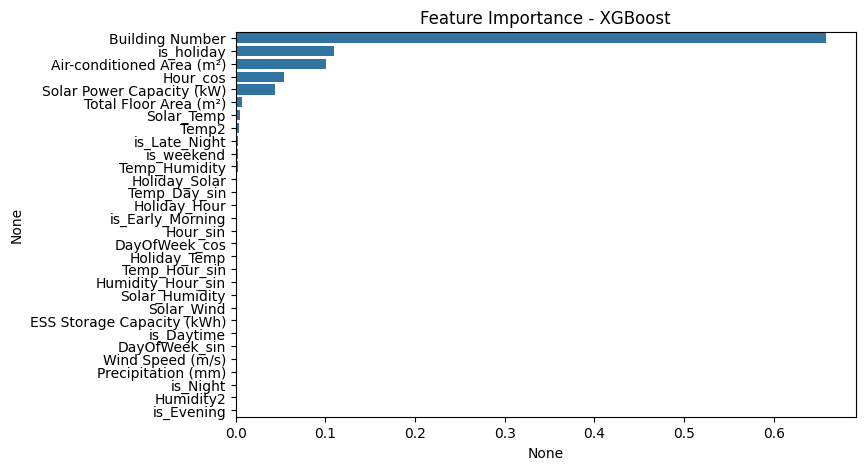

LightGBM Safe MAPE: 3.72%


In [25]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# ===== Prepare features & target =====
X = train_hospital[features]
y = train_hospital['Power Consumption (kWh)']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== XGBoost Regression model =====
xgb_model = XGBRegressor(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=1.0,
    random_state=42
)

xgb_model.fit(X_train, y_train)

# ===== Predictions =====
y_pred = xgb_model.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100

print(f"XGBoost MSE: {mse:.2f}")
print(f"XGBoost RMSE: {rmse:.2f}")
print(f"XGBoost R2: {r2:.4f}")
print(f"XGBoost MAPE: {mape:.2f}%")

# ===== Feature importance =====
feat_imp = pd.Series(xgb_model.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - XGBoost")
plt.show()
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)
print(f"LightGBM Safe MAPE: {mape:.2f}%")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2628
[LightGBM] [Info] Number of data points in the train set: 16524, number of used features: 30
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 4473.881852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

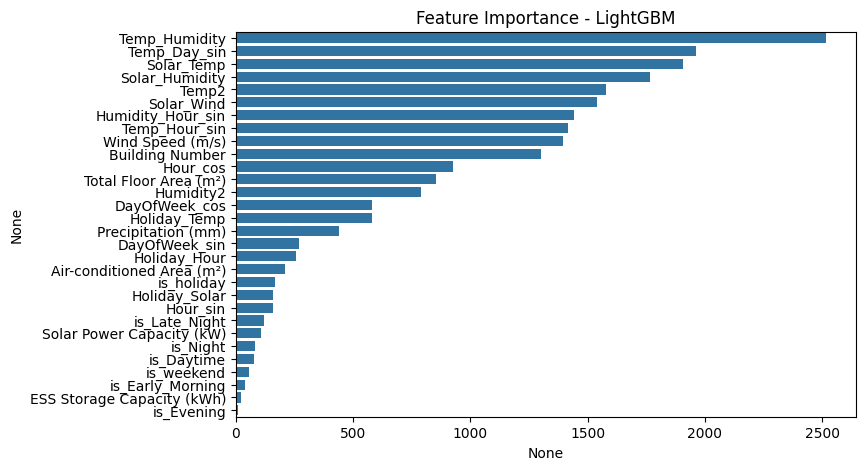

In [59]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ===== Prepare features & target =====
X = train_hospital[features]
y = train_hospital['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM Regression model =====
model_hospital = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=700,
    max_depth=6,
    learning_rate=0.1,
    num_leaves=90,
    subsample=0.8,
    colsample_bytree=1.0,
    random_state=42
)

# Train the model
model_hospital.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_hospital.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Safe MAPE to avoid division by zero
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM Safe MAPE: {mape:.2f}%")

# ===== Feature importance =====
feat_imp = pd.Series(model_hospital.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()


In [60]:
# Features for prediction — must match training features
X_future = test_hospital[features]
# Predict
test_hospital['Predicted Power Consumption (kWh)'] = model_hospital.predict(X_future)

# Save predictions
test_hospital.to_csv("hospital_predictions.csv", index=False)
df_new_hospital = pd.read_csv("hospital_predictions.csv")

df_new_hospital.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\2782358272.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_hospital['Predicted Power Consumption (kWh)'] = model_hospital.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,3_20240825 00,3,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,NaN,0.0,0,...,-20.718534,0.000000,26.5,278.58,0.000000,702.25,6400.0,77606.8164,NaN,13811.305231
1,3_20240825 01,3,2024-08-25 01:00:00,26.1,0.0,0.0,80.0,NaN,0.0,1,...,-20.405802,20.705524,26.1,278.58,0.258819,681.21,6400.0,77606.8164,NaN,13375.762335
2,3_20240825 02,3,2024-08-25 02:00:00,25.9,0.0,0.3,83.0,NaN,0.0,2,...,-20.249435,41.500000,25.9,278.58,0.500000,670.81,6889.0,77606.8164,NaN,13848.277407
3,3_20240825 03,3,2024-08-25 03:00:00,25.7,0.0,1.1,83.0,NaN,0.0,3,...,-20.093069,58.689863,25.7,278.58,0.707107,660.49,6889.0,77606.8164,NaN,13594.868836
4,3_20240825 04,3,2024-08-25 04:00:00,25.5,0.0,1.0,86.0,NaN,0.0,4,...,-19.936703,74.478185,25.5,278.58,0.866025,650.25,7396.0,77606.8164,NaN,13885.689821


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000699 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2311
[LightGBM] [Info] Number of data points in the train set: 14688, number of used features: 30
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 2162.468059
LightGBM MSE: 20013.61
LightGBM RMSE: 141.47
LightGBM R2: 0.9960
LightGBM MAPE: 4.51%
LightGBM SMAPE: 2.23%


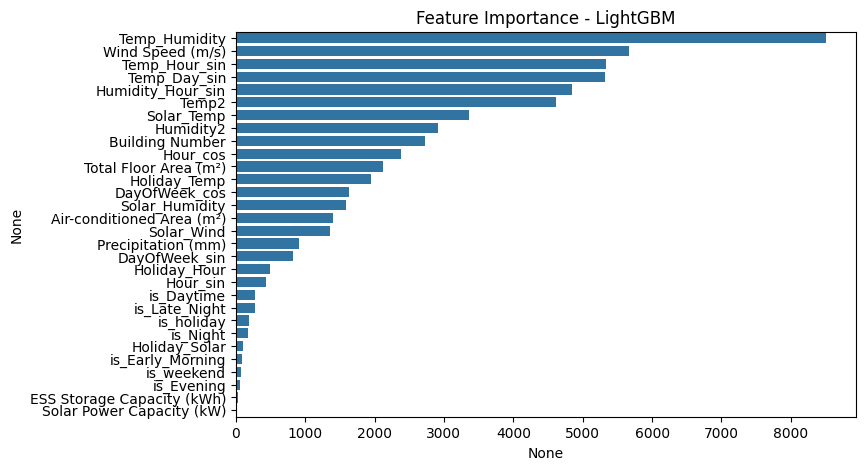

In [23]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ===== SMAPE Function =====
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = np.abs(y_true) + np.abs(y_pred)
    # Avoid division by zero by adding a small epsilon
    denominator = np.where(denominator == 0, np.finfo(float).eps, denominator)
    return np.mean(numerator / denominator) * 100

# ===== Prepare features & target =====
X = train_other[features]
y = train_other['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_other = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=300,
    learning_rate=0.1,
    num_leaves=200,
    random_state=42
)

# Train (with eval_set for monitoring)
model_other.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_other.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
# Safe MAPE with epsilon to handle zero values
epsilon = np.finfo(float).eps  # Smallest positive float value
mape = mean_absolute_percentage_error(y_test, y_pred + epsilon) * 100  # Add epsilon to predictions
smape_value = smape(y_test, y_pred)

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")
print(f"LightGBM SMAPE: {smape_value:.2f}%")

# ===== Feature importance =====
feat_imp = pd.Series(model_other.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()

Random Forest RMSE: 150.5499
Random Forest R²: 0.9955
Random Forest MAPE: 4.67%


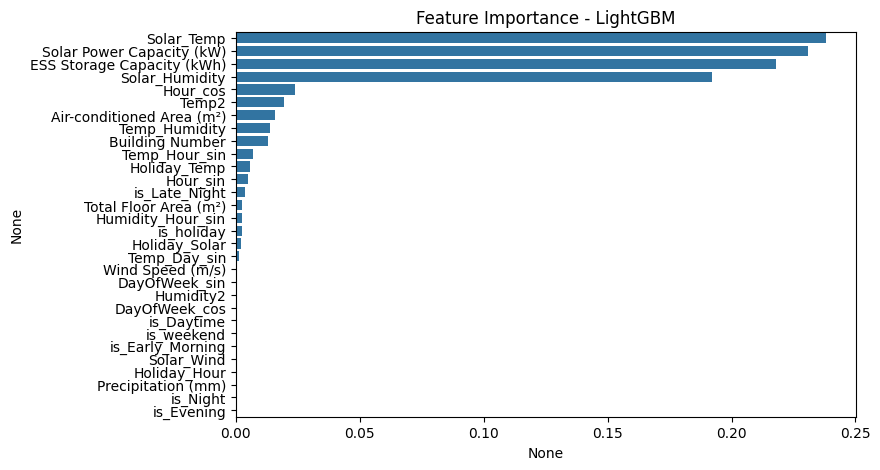

In [24]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

rf_model = RandomForestRegressor(
    n_estimators=400,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42,
    n_jobs=-1
)

# Train
rf_model.fit(X_train, y_train)

# Predict
y_pred = rf_model.predict(X_test)

# Evaluation
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # in percentage

print(f"Random Forest RMSE: {rmse:.4f}")
print(f"Random Forest R²: {r2:.4f}")
print(f"Random Forest MAPE: {mape:.2f}%")
feat_imp = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()

In [25]:
# Features for prediction — must match training features
X_future = test_other[features]

# Predict
test_other['Predicted Power Consumption (kWh)'] = model_other.predict(X_future)

# Save predictions
test_other.to_csv("other_predictions.csv", index=False)
df_new_other = pd.read_csv("other_predictions.csv")

df_new_other.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_24836\986456608.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_other['Predicted Power Consumption (kWh)'] = model_other.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,7_20240825 00,7,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,NaN,0.0,0,...,-20.718534,0.000000,26.5,389.76,0.000000,702.25,6400.0,151912.8576,NaN,1081.168133
1,7_20240825 01,7,2024-08-25 01:00:00,26.1,0.0,0.0,80.0,NaN,0.0,1,...,-20.405802,20.705524,26.1,389.76,0.258819,681.21,6400.0,151912.8576,NaN,988.190226
2,7_20240825 02,7,2024-08-25 02:00:00,25.9,0.0,0.3,83.0,NaN,0.0,2,...,-20.249435,41.500000,25.9,389.76,0.500000,670.81,6889.0,151912.8576,NaN,925.702777
3,7_20240825 03,7,2024-08-25 03:00:00,25.7,0.0,1.1,83.0,NaN,0.0,3,...,-20.093069,58.689863,25.7,389.76,0.707107,660.49,6889.0,151912.8576,NaN,845.715589
4,7_20240825 04,7,2024-08-25 04:00:00,25.5,0.0,1.0,86.0,NaN,0.0,4,...,-19.936703,74.478185,25.5,389.76,0.866025,650.25,7396.0,151912.8576,NaN,863.739252


In [40]:
# # Features for prediction — must match training features
# X_future = test_other[['Total Floor Area (m²)', 'Air-conditioned Area (m²)', 
#                   'is_weekend', 'is_Morning', 'is_Evening', 'is_Night', 'is_Afternoon',
#                   'Wind Speed (m/s)', 'Precipitation (mm)', 'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)', 'Solar Power Capacity (kW)',
#                   'DayOfWeek_sin', 'DayOfWeek_cos',
#                   'Hour_sin', 'Hour_cos', 'Temperature (°C)', 
#                    'Humidity (%)'
#                    ]]

# # Predict
# test_other['Predicted Power Consumption (kWh)'] = rf_model.predict(X_future)

# # Save predictions
# test_other.to_csv("other_predictions.csv", index=False)
# df_new_other = pd.read_csv("other_predictions.csv")

# df_new_other.head()

In [41]:
train.columns

Index(['num_date_time', 'Building Number', 'Datetime', 'Temperature (°C)',
       'Precipitation (mm)', 'Wind Speed (m/s)', 'Humidity (%)',
       'Sunshine Duration (hr)', 'Solar Radiation (MJ/m²)',
       'Power Consumption (kWh)', 'Hour', 'Day', 'Air-conditioned Area (m²)',
       'Total Floor Area (m²)', 'Building Type', 'Solar Power Capacity (kW)',
       'ESS Storage Capacity (kWh)', 'PCS Capacity (kW)', 'DayOfWeek', 'Month',
       'Week', 'is_weekend', 'Hour_sin', 'Hour_cos', 'DayOfWeek_sin',
       'DayOfWeek_cos', 'Day_sin', 'Day_cos', 'Month_sin', 'Month_cos',
       'Week_sin', 'Week_cos', 'is_Afternoon', 'is_Evening', 'is_Morning',
       'is_Night', 'is_rain_light', 'is_rain_moderate', 'is_rain_heavy',
       'is_cold', 'is_mild', 'is_hot', 'is_calm', 'is_breezy', 'is_windy',
       'is_stormy', 'is_low_rad', 'is_medium_rad', 'is_high_rad',
       'RollingMean_24h', 'RollingStd_24h', 'RollingMedian_24h',
       'RollingMean_72h', 'RollingStd_72h', 'RollingMedian_72h',
   

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1865
[LightGBM] [Info] Number of data points in the train set: 16524, number of used features: 24
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 1108.187045
LightGBM MSE: 10000.75
LightGBM RMSE: 100.00
LightGBM R2: 0.9861
LightGBM MAPE: 299319161707132928.00%


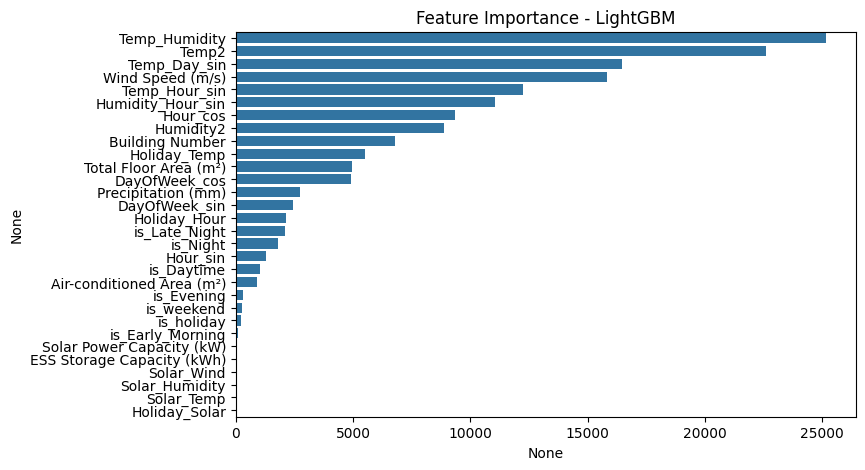

LightGBM Safe MAPE: 8.49%


In [41]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_apartment[features]
y = train_apartment['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_ap = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=800,
    learning_rate=0.01,
    num_leaves=200,
    random_state=42
)

# Train (no 'verbose' here)
model_ap.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_ap.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_ap.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)
print(f"LightGBM Safe MAPE: {mape:.2f}%")


Random Forest MSE: 11469.28
Random Forest RMSE: 107.09
Random Forest R2: 0.9841
Random Forest Safe MAPE: 5.43%


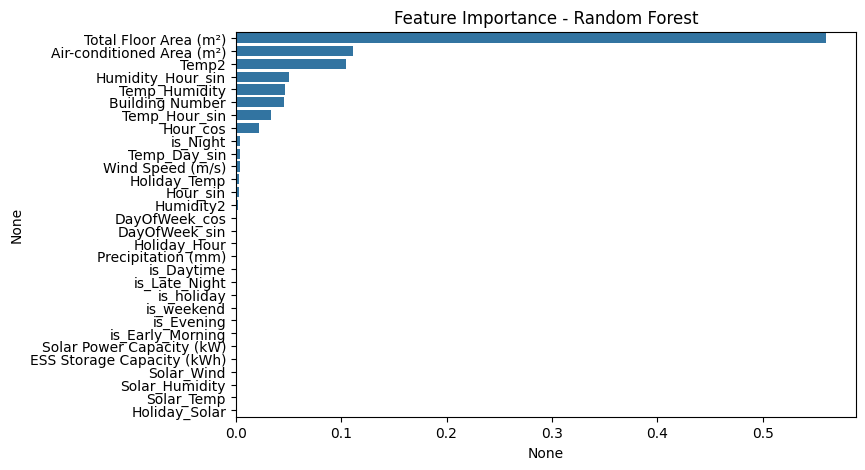

In [79]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ===== Prepare features & target =====
X = train_apartment[features]
y = train_apartment['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== Random Forest model =====
rf_model_ap = RandomForestRegressor(
    n_estimators=600,        # number of trees
    max_depth=None,          # no max depth
    min_samples_split=2,     # minimum samples to split
    min_samples_leaf=1,      # minimum samples at leaf
    random_state=42,
    n_jobs=-1
)

# Train
rf_model_ap.fit(X_train, y_train)

# ===== Predictions =====
y_pred = rf_model_ap.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Safe MAPE function
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)

print(f"Random Forest MSE: {mse:.2f}")
print(f"Random Forest RMSE: {rmse:.2f}")
print(f"Random Forest R2: {r2:.4f}")
print(f"Random Forest Safe MAPE: {mape:.2f}%")

# ===== Feature importance =====
feat_imp = pd.Series(rf_model_ap.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - Random Forest")
plt.show()


In [80]:
# Features for prediction — must match training features
X_future = test_apartment[features]
# Predict
test_apartment['Predicted Power Consumption (kWh)'] = rf_model_ap.predict(X_future)

# Save predictions
test_apartment.to_csv("apartment_predictions.csv", index=False)
df_new_apartment = pd.read_csv("apartment_predictions.csv")

df_new_apartment.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\1127591273.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_apartment['Predicted Power Consumption (kWh)'] = rf_model_ap.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,11_20240825 00,11,2024-08-25 00:00:00,26.3,0.0,0.4,88.0,NaN,0.0,0,...,-20.562168,0.000000,26.3,0.0,0.000000,691.69,7744.0,0.0,NaN,1417.687500
1,11_20240825 01,11,2024-08-25 01:00:00,25.9,0.0,0.2,89.0,NaN,0.0,1,...,-20.249435,23.034895,25.9,0.0,0.258819,670.81,7921.0,0.0,NaN,1211.180367
2,11_20240825 02,11,2024-08-25 02:00:00,25.7,0.0,0.8,91.0,NaN,0.0,2,...,-20.093069,45.500000,25.7,0.0,0.500000,660.49,8281.0,0.0,NaN,1058.657933
3,11_20240825 03,11,2024-08-25 03:00:00,25.3,0.0,0.4,92.0,NaN,0.0,3,...,-19.780337,65.053824,25.3,0.0,0.707107,640.09,8464.0,0.0,NaN,937.037200
4,11_20240825 04,11,2024-08-25 04:00:00,25.1,0.0,0.8,93.0,NaN,0.0,4,...,-19.623970,80.540363,25.1,0.0,0.866025,630.01,8649.0,0.0,NaN,877.221767


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2610
[LightGBM] [Info] Number of data points in the train set: 16524, number of used features: 30
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 2109.511286
LightGBM MSE: 55666.48
LightGBM RMSE: 235.94
LightGBM R2: 0.9385
LightGBM MAPE: 5.81%


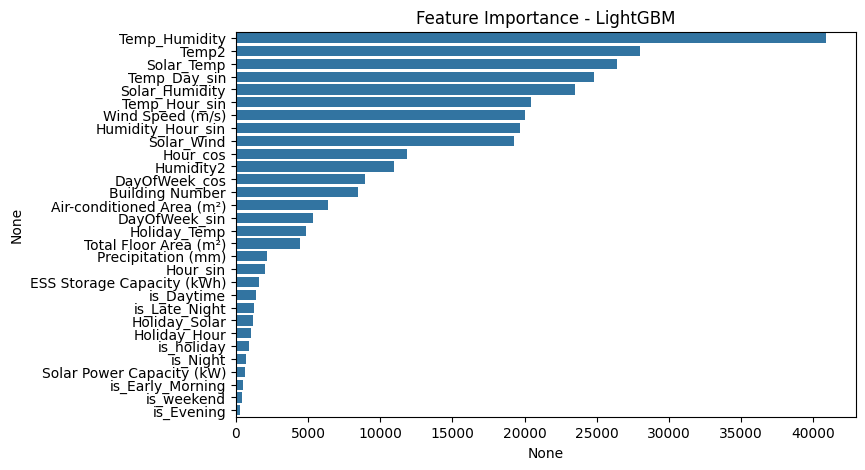

Random Forest MSE: 57323.98, RMSE: 239.42, R2: 0.9366, MAPE: 5.54%


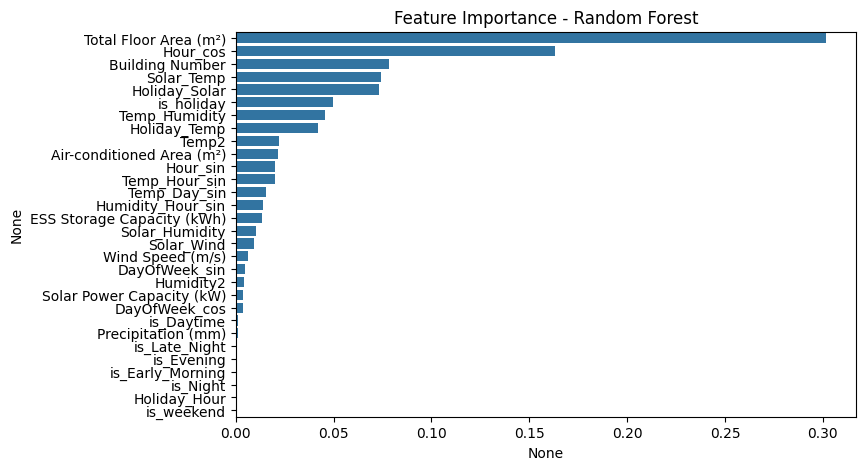

In [84]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_research[features]

y = train_research['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_r = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=1500,
    learning_rate=0.01,
    num_leaves=200,
    random_state=42
)

# Train (no 'verbose' here)
model_r.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_r.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_r.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()

from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ===== Features & Target =====
X = train_research[features]
y = train_research['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# # ===== XGBoost Regressor =====
# xgb_model = XGBRegressor(
#     n_estimators=1000,
#     max_depth=6,
#     learning_rate=0.01,
#     subsample=0.8,
#     colsample_bytree=1.0,
#     random_state=42
# )
# xgb_model.fit(X_train, y_train)
# y_pred_xgb = xgb_model.predict(X_test)

# # Metrics for XGB
# mse = mean_squared_error(y_test, y_pred_xgb)
# rmse = np.sqrt(mse)
# r2 = r2_score(y_test, y_pred_xgb)
# mape = mean_absolute_percentage_error(y_test, y_pred_xgb) * 100
# print(f"XGBoost MSE: {mse:.2f}, RMSE: {rmse:.2f}, R2: {r2:.4f}, MAPE: {mape:.2f}%")

# # Feature importance
# feat_imp_xgb = pd.Series(xgb_model.feature_importances_, index=X.columns).sort_values(ascending=False)
# plt.figure(figsize=(8,5))
# sns.barplot(x=feat_imp_xgb, y=feat_imp_xgb.index)
# plt.title("Feature Importance - XGBoost")
# plt.show()

# ===== Random Forest Regressor =====
rf_model = RandomForestRegressor(
    n_estimators=500,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

# Metrics for RF
mse = mean_squared_error(y_test, y_pred_rf)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_rf)
mape = mean_absolute_percentage_error(y_test, y_pred_rf) * 100
print(f"Random Forest MSE: {mse:.2f}, RMSE: {rmse:.2f}, R2: {r2:.4f}, MAPE: {mape:.2f}%")

# Feature importance
feat_imp_rf = pd.Series(rf_model.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(8,5))
sns.barplot(x=feat_imp_rf, y=feat_imp_rf.index)
plt.title("Feature Importance - Random Forest")
plt.show()


In [85]:
# Features for prediction — must match training features
X_future = test_research[features]

# Predict
test_research['Predicted Power Consumption (kWh)'] = model_r.predict(X_future)

# Save predictions
test_research.to_csv("research_predictions.csv", index=False)
df_new_research = pd.read_csv("research_predictions.csv")

df_new_research.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\2898076530.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_research['Predicted Power Consumption (kWh)'] = model_r.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,13_20240825 00,13,2024-08-25 00:00:00,26.3,0.0,0.4,88.0,NaN,0.0,0,...,-20.562168,0.000000,26.3,276.0,0.000000,691.69,7744.0,76176.0,NaN,2040.162113
1,13_20240825 01,13,2024-08-25 01:00:00,25.9,0.0,0.2,89.0,NaN,0.0,1,...,-20.249435,23.034895,25.9,276.0,0.258819,670.81,7921.0,76176.0,NaN,2034.727580
2,13_20240825 02,13,2024-08-25 02:00:00,25.7,0.0,0.8,91.0,NaN,0.0,2,...,-20.093069,45.500000,25.7,276.0,0.500000,660.49,8281.0,76176.0,NaN,2002.749630
3,13_20240825 03,13,2024-08-25 03:00:00,25.3,0.0,0.4,92.0,NaN,0.0,3,...,-19.780337,65.053824,25.3,276.0,0.707107,640.09,8464.0,76176.0,NaN,1970.524240
4,13_20240825 04,13,2024-08-25 04:00:00,25.1,0.0,0.8,93.0,NaN,0.0,4,...,-19.623970,80.540363,25.1,276.0,0.866025,630.01,8649.0,76176.0,NaN,1920.983395


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001599 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2683
[LightGBM] [Info] Number of data points in the train set: 29376, number of used features: 30
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 2732.097171
LightGBM MSE: 68395.69
LightGBM RMSE: 261.53
LightGBM R2: 0.9923
LightGBM MAPE: 6.98%


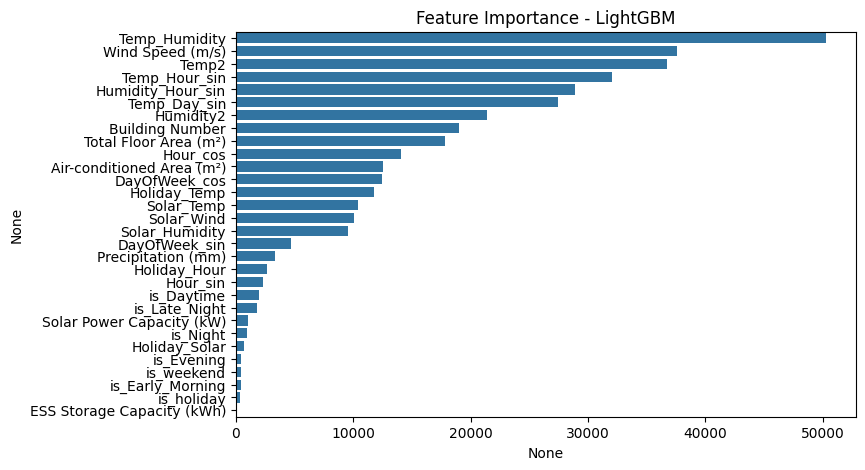

LightGBM Safe MAPE: 6.98%


In [38]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_department[features]
y = train_department['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_dep = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=1500,
    learning_rate=0.05,
    num_leaves=250,
    random_state=42
)

# Train (no 'verbose' here)
model_dep.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_dep.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_dep.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)
print(f"LightGBM Safe MAPE: {mape:.2f}%")


In [96]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# ===== Safe MAPE function =====
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== Model =====
rf_model_dep = RandomForestRegressor(
    n_estimators=2000,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42,
    n_jobs=-1
)

# ===== Train =====
rf_model_dep.fit(X_train, y_train)

# ===== Predict =====
y_pred = rf_model_dep.predict(X_test)

# ===== Metrics =====
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
mape = safe_mape(y_test, y_pred)

print(f"Random Forest RMSE: {rmse:.4f}")
print(f"Random Forest R²: {r2:.4f}")
print(f"Random Forest Safe MAPE: {mape:.2f}%")


Random Forest RMSE: 261.7801
Random Forest R²: 0.9923
Random Forest Safe MAPE: 7.10%


XGBoost MSE: 70305.12
XGBoost RMSE: 265.15
XGBoost R2: 0.9921
XGBoost MAPE: 7.97%


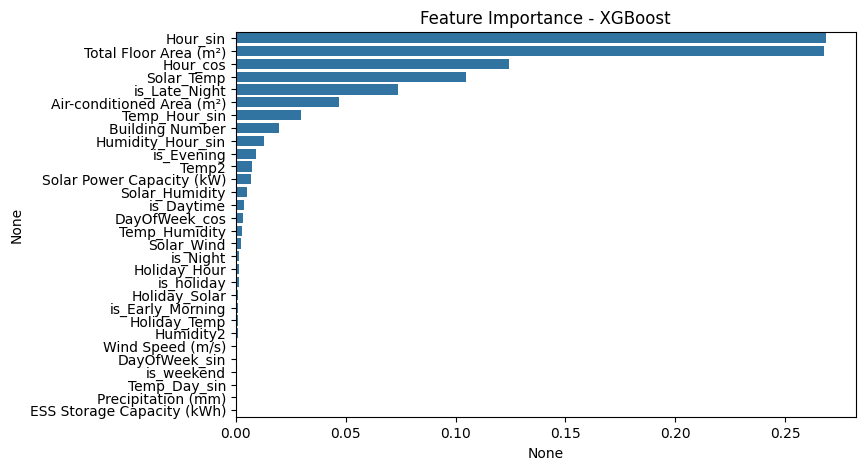

XGBoost Safe MAPE: 7.97%


In [99]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ===== XGBoost model =====
xgb_model = XGBRegressor(
    n_estimators=2000,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=1.0,
    random_state=42
)

xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred_xgb)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_xgb)
mape = mean_absolute_percentage_error(y_test, y_pred_xgb) * 100

print(f"XGBoost MSE: {mse:.2f}")
print(f"XGBoost RMSE: {rmse:.2f}")
print(f"XGBoost R2: {r2:.4f}")
print(f"XGBoost MAPE: {mape:.2f}%")

# ===== Feature importance =====
feat_imp_xgb = pd.Series(xgb_model.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp_xgb, y=feat_imp_xgb.index)
plt.title("Feature Importance - XGBoost")
plt.show()

# ===== Safe MAPE =====
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

safe_mape_val = safe_mape(y_test, y_pred_xgb)
print(f"XGBoost Safe MAPE: {safe_mape_val:.2f}%")


In [100]:
# Features for prediction — must match training features
X_future = test_department[features]

# Predict
test_department['Predicted Power Consumption (kWh)'] = model_dep.predict(X_future)

# Save predictions
test_department.to_csv("dept_predictions.csv", index=False)
df_new_dept = pd.read_csv("dept_predictions.csv")

df_new_dept.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\1198628322.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_department['Predicted Power Consumption (kWh)'] = model_dep.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,18_20240825 00,18,2024-08-25 00:00:00,25.0,0.0,0.2,90.0,NaN,0.0,0,...,-19.545787,0.000000,25.0,0.0,0.000000,625.00,8100.0,0.0,NaN,587.549594
1,18_20240825 01,18,2024-08-25 01:00:00,24.7,0.0,1.0,92.0,NaN,0.0,1,...,-19.311238,23.811352,24.7,0.0,0.258819,610.09,8464.0,0.0,NaN,527.803197
2,18_20240825 02,18,2024-08-25 02:00:00,24.3,0.0,0.9,94.0,NaN,0.0,2,...,-18.998505,47.000000,24.3,0.0,0.500000,590.49,8836.0,0.0,NaN,490.580020
3,18_20240825 03,18,2024-08-25 03:00:00,24.2,0.0,0.6,94.0,NaN,0.0,3,...,-18.920322,66.468037,24.2,0.0,0.707107,585.64,8836.0,0.0,NaN,505.550611
4,18_20240825 04,18,2024-08-25 04:00:00,23.9,0.0,0.7,95.0,NaN,0.0,4,...,-18.685772,82.272413,23.9,0.0,0.866025,571.21,9025.0,0.0,NaN,547.853728


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002463 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2566
[LightGBM] [Info] Number of data points in the train set: 16524, number of used features: 29
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 10319.175075
LightGBM MSE: 66540.09
LightGBM RMSE: 257.95
LightGBM R2: 0.9969
LightGBM MAPE: 1.57%


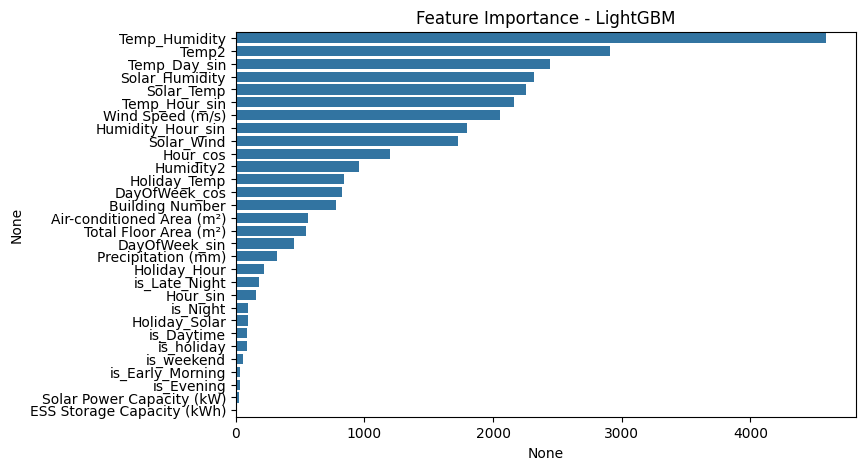

LightGBM Safe MAPE: 1.57%


In [104]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_idc[features]
y = train_idc['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_idc = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=200,
    learning_rate=0.1,
    num_leaves=150,
    random_state=42
)

# Train (no 'verbose' here)
model_idc.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_idc.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_idc.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)
print(f"LightGBM Safe MAPE: {mape:.2f}%")


In [105]:
# Features for prediction — must match training features
X_future = test_idc[features]


# Predict
test_idc['Predicted Power Consumption (kWh)'] = model_idc.predict(X_future)

# Save predictions
test_idc.to_csv("idc_predictions.csv", index=False)
df_new_idc = pd.read_csv("idc_predictions.csv")

df_new_idc.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\3158913686.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_idc['Predicted Power Consumption (kWh)'] = model_idc.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,30_20240825 00,30,2024-08-25 00:00:00,25.0,0.0,0.2,90.0,NaN,0.0,0,...,-19.545787,0.000000,25.0,0.0,0.000000,625.00,8100.0,0.0,NaN,9811.057736
1,30_20240825 01,30,2024-08-25 01:00:00,24.7,0.0,1.0,92.0,NaN,0.0,1,...,-19.311238,23.811352,24.7,0.0,0.258819,610.09,8464.0,0.0,NaN,9800.650802
2,30_20240825 02,30,2024-08-25 02:00:00,24.3,0.0,0.9,94.0,NaN,0.0,2,...,-18.998505,47.000000,24.3,0.0,0.500000,590.49,8836.0,0.0,NaN,9776.197769
3,30_20240825 03,30,2024-08-25 03:00:00,24.2,0.0,0.6,94.0,NaN,0.0,3,...,-18.920322,66.468037,24.2,0.0,0.707107,585.64,8836.0,0.0,NaN,9755.028072
4,30_20240825 04,30,2024-08-25 04:00:00,23.9,0.0,0.7,95.0,NaN,0.0,4,...,-18.685772,82.272413,23.9,0.0,0.866025,571.21,9025.0,0.0,NaN,9758.712328


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2608
[LightGBM] [Info] Number of data points in the train set: 14688, number of used features: 30
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 1626.304522
LightGBM MSE: 20618.63
LightGBM RMSE: 143.59
LightGBM R2: 0.9622
LightGBM MAPE: 5.68%


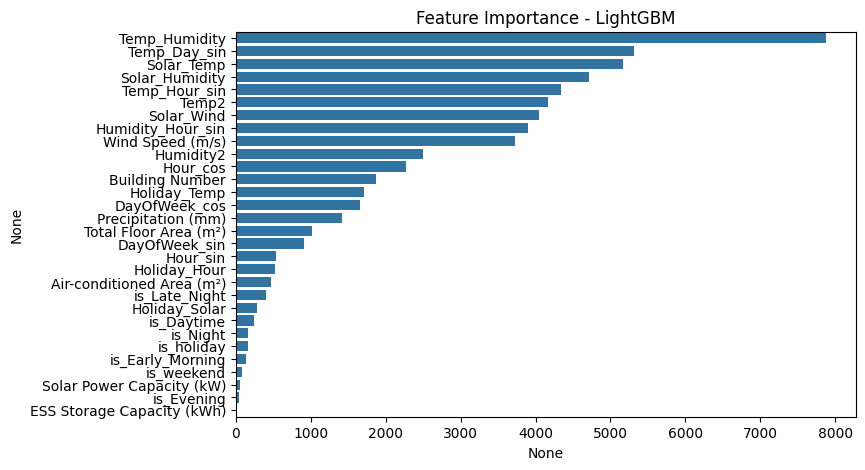

LightGBM Safe MAPE: 5.68%


In [117]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_public[features]
y = train_public['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== LightGBM model =====
model_p = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=300,
    learning_rate=0.05,
    num_leaves=200,
    random_state=42
)

# Train (no 'verbose' here)
model_p.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_p.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_p.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)
print(f"LightGBM Safe MAPE: {mape:.2f}%")


XGBoost MSE: 20892.05
XGBoost RMSE: 144.54
XGBoost R2: 0.9617
XGBoost MAPE: 5.55%
XGBoost Safe MAPE: 5.55%


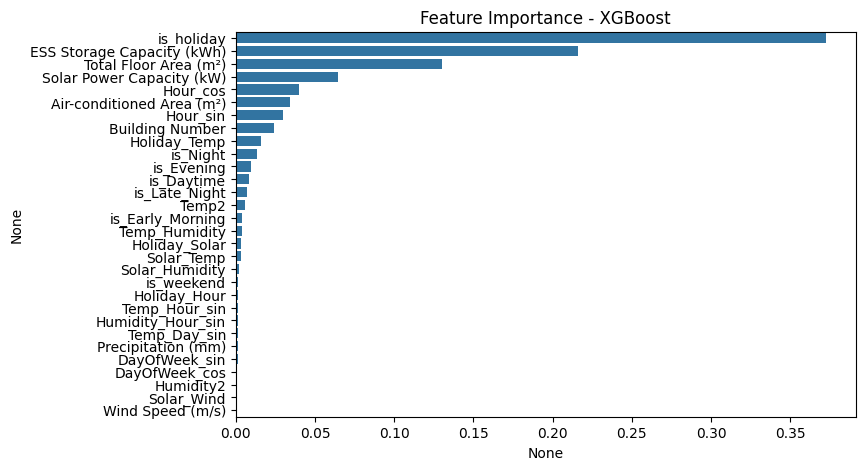

In [118]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ===== Prepare features & target =====
X = train_public[features]
y = train_public['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# ===== XGBoost model =====
model_xgb_dep = xgb.XGBRegressor(
    n_estimators=1500,
    learning_rate=0.05,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    tree_method='hist',   # faster training
    enable_categorical=False
)

# Train
model_xgb_dep.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)

# ===== Predictions =====
y_pred = model_xgb_dep.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100

print(f"XGBoost MSE: {mse:.2f}")
print(f"XGBoost RMSE: {rmse:.2f}")
print(f"XGBoost R2: {r2:.4f}")
print(f"XGBoost MAPE: {mape:.2f}%")

# ===== Safe MAPE =====
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

safe_mape_val = safe_mape(y_test, y_pred)
print(f"XGBoost Safe MAPE: {safe_mape_val:.2f}%")

# ===== Feature importance =====
feat_imp = pd.Series(model_xgb_dep.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - XGBoost")
plt.show()


Random Forest MSE: 22014.17
Random Forest RMSE: 148.37
Random Forest R2: 0.9596
Random Forest Safe MAPE: 5.72%



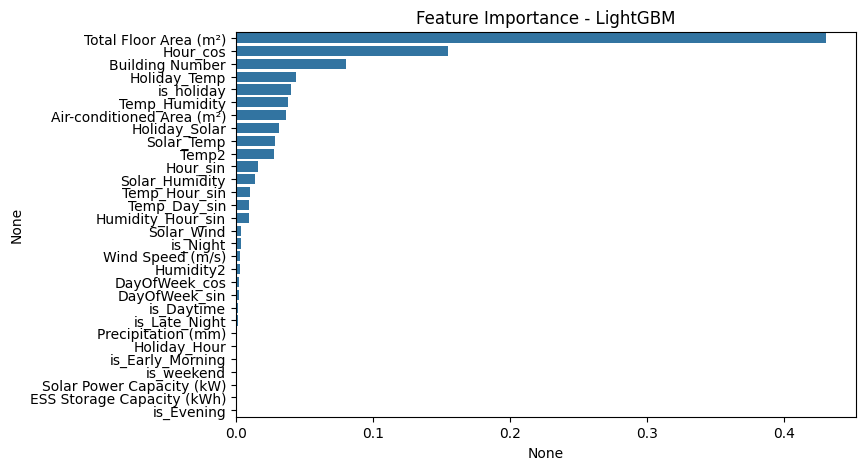

In [119]:

# ===== Random Forest =====
model_rf_public = RandomForestRegressor(
    n_estimators=500,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)
model_rf_public.fit(X_train, y_train)
y_pred_rf = model_rf_public.predict(X_test)

# ===== Metrics Function =====
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

def evaluate_model(name, y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    mape = safe_mape(y_true, y_pred)
    print(f"{name} MSE: {mse:.2f}")
    print(f"{name} RMSE: {rmse:.2f}")
    print(f"{name} R2: {r2:.4f}")
    print(f"{name} Safe MAPE: {mape:.2f}%\n")

# ===== Evaluate All =====
# evaluate_model("LightGBM", y_test, y_pred_lgb)
# evaluate_model("XGBoost", y_test, y_pred_xgb)
evaluate_model("Random Forest", y_test, y_pred_rf)

# ===== Feature Importance (LightGBM example) =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_rf_public.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()

In [120]:
# Features for prediction — must match training features
X_future = test_public[features]
# Predict
test_public['Predicted Power Consumption (kWh)'] = model_p.predict(X_future)

# Save predictions
test_public.to_csv("public_predictions.csv", index=False)
df_new_public = pd.read_csv("public_predictions.csv")

df_new_public.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\2054771711.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_public['Predicted Power Consumption (kWh)'] = model_p.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,33_20240825 00,33,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,NaN,0.0,0,...,-20.718534,0.000000,26.5,344.96,0.000000,702.25,6400.0,118997.4016,NaN,1507.262538
1,33_20240825 01,33,2024-08-25 01:00:00,26.1,0.0,0.0,80.0,NaN,0.0,1,...,-20.405802,20.705524,26.1,344.96,0.258819,681.21,6400.0,118997.4016,NaN,1641.455944
2,33_20240825 02,33,2024-08-25 02:00:00,25.9,0.0,0.3,83.0,NaN,0.0,2,...,-20.249435,41.500000,25.9,344.96,0.500000,670.81,6889.0,118997.4016,NaN,1509.992889
3,33_20240825 03,33,2024-08-25 03:00:00,25.7,0.0,1.1,83.0,NaN,0.0,3,...,-20.093069,58.689863,25.7,344.96,0.707107,660.49,6889.0,118997.4016,NaN,1779.605623
4,33_20240825 04,33,2024-08-25 04:00:00,25.5,0.0,1.0,86.0,NaN,0.0,4,...,-19.936703,74.478185,25.5,344.96,0.866025,650.25,7396.0,118997.4016,NaN,1311.656119


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2094
[LightGBM] [Info] Number of data points in the train set: 13872, number of used features: 29
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 2796.644032
LightGBM MSE: 48157.50
LightGBM RMSE: 219.45
LightGBM R2: 0.9908
LightGBM MAPE: 5.75%


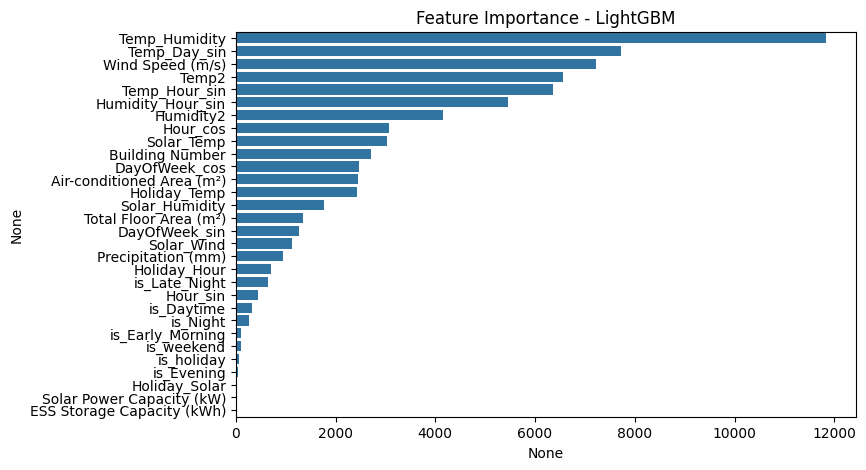

LightGBM Safe MAPE: 5.75%

===== XGBoost Results =====
MSE: 48101.45
RMSE: 219.32
R2: 0.9909
Safe MAPE: 5.89%


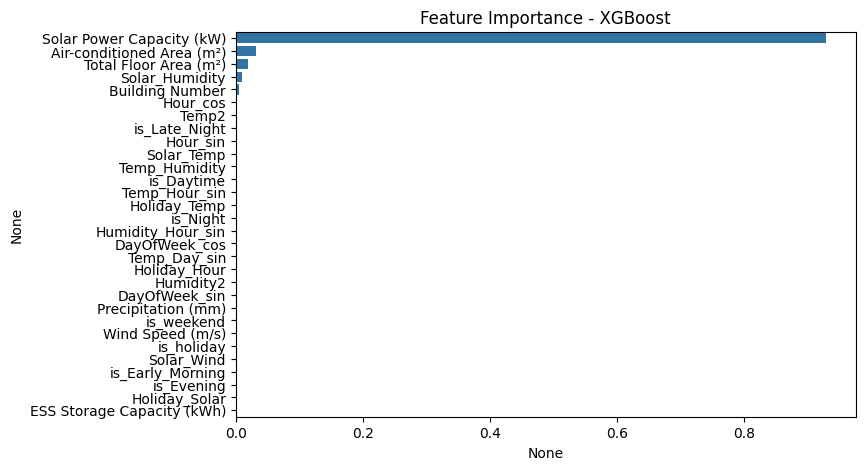

In [20]:

import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np
import pandas as pd

# ===== Prepare features & target =====
X = train_hotel[features]
y = train_hotel['Power_MA_3']

# ===== Train-test split =====
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

# ===== LightGBM model =====
model_hotel = lgb.LGBMRegressor(
    boosting_type='gbdt',
    n_estimators=300,
    learning_rate=0.05,
    num_leaves=250,
    random_state=42
)

# Train (no 'verbose' here)
model_hotel.fit(X_train, y_train, eval_set=[(X_test, y_test)])

# ===== Predictions =====
y_pred = model_hotel.predict(X_test)

# ===== Metrics =====
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # %

print(f"LightGBM MSE: {mse:.2f}")
print(f"LightGBM RMSE: {rmse:.2f}")
print(f"LightGBM R2: {r2:.4f}")
print(f"LightGBM MAPE: {mape:.2f}%")

# ===== Feature importance =====
import matplotlib.pyplot as plt
import seaborn as sns

feat_imp = pd.Series(model_hotel.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp, y=feat_imp.index)
plt.title("Feature Importance - LightGBM")
plt.show()
def safe_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    nonzero_mask = y_true != 0
    return np.mean(np.abs((y_true[nonzero_mask] - y_pred[nonzero_mask]) / y_true[nonzero_mask])) * 100

mape = safe_mape(y_test, y_pred)
print(f"LightGBM Safe MAPE: {mape:.2f}%")

import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor

# ===== XGBoost =====
model_xgb = xgb.XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    tree_method="hist"   # faster, try "gpu_hist" if GPU is available
)

model_xgb.fit(X_train, y_train, eval_set=[(X_test, y_test)], verbose=False)

y_pred_xgb = model_xgb.predict(X_test)

mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)
mape_xgb = safe_mape(y_test, y_pred_xgb)

print("\n===== XGBoost Results =====")
print(f"MSE: {mse_xgb:.2f}")
print(f"RMSE: {rmse_xgb:.2f}")
print(f"R2: {r2_xgb:.4f}")
print(f"Safe MAPE: {mape_xgb:.2f}%")
feat_imp_xgb = pd.Series(model_xgb.feature_importances_, index=X.columns).sort_values(ascending=False)
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp_xgb, y=feat_imp_xgb.index)
plt.title("Feature Importance - XGBoost")
plt.show()


# # ===== Random Forest =====
# model_rf = RandomForestRegressor(
#     n_estimators=500,
#     max_depth=None,
#     min_samples_split=2,
#     min_samples_leaf=1,
#     n_jobs=-1,
#     random_state=42
# )

# model_rf.fit(X_train, y_train)

# y_pred_rf = model_rf.predict(X_test)

# mse_rf = mean_squared_error(y_test, y_pred_rf)
# rmse_rf = np.sqrt(mse_rf)
# r2_rf = r2_score(y_test, y_pred_rf)
# mape_rf = safe_mape(y_test, y_pred_rf)

# print("\n===== Random Forest Results =====")
# print(f"MSE: {mse_rf:.2f}")
# print(f"RMSE: {rmse_rf:.2f}")
# print(f"R2: {r2_rf:.4f}")
# print(f"Safe MAPE: {mape_rf:.2f}%")



In [138]:
# Features for prediction — must match training features
X_future = test_hotel[features]

# Predict
test_hotel['Predicted Power Consumption (kWh)'] = model_hotel.predict(X_future)

# Save predictions
test_hotel.to_csv("hotel_predictions.csv", index=False)
df_new_hotel = pd.read_csv("hotel_predictions.csv")

df_new_hotel.head()

C:\Users\Dell\AppData\Local\Temp\ipykernel_22036\176847961.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_hotel['Predicted Power Consumption (kWh)'] = model_hotel.predict(X_future)


,num_date_time,Building Number,Datetime,Temperature (°C),Precipitation (mm),Wind Speed (m/s),Humidity (%),Sunshine Duration (hr),Solar Radiation (MJ/m²),Hour,...,Temp_Day_sin,Humidity_Hour_sin,Holiday_Temp,Holiday_Solar,Holiday_Hour,Temp2,Humidity2,Solar2,Power_MA_3,Predicted Power Consumption (kWh)
0,1_20240825 00,1,2024-08-25 00:00:00,26.5,0.0,0.7,80.0,NaN,0.0,0,...,-20.718534,0.000000,26.5,0.0,0.000000,702.25,6400.0,0.0,NaN,4905.616821
1,1_20240825 01,1,2024-08-25 01:00:00,26.1,0.0,0.0,80.0,NaN,0.0,1,...,-20.405802,20.705524,26.1,0.0,0.258819,681.21,6400.0,0.0,NaN,4877.184783
2,1_20240825 02,1,2024-08-25 02:00:00,25.9,0.0,0.3,83.0,NaN,0.0,2,...,-20.249435,41.500000,25.9,0.0,0.500000,670.81,6889.0,0.0,NaN,3927.885363
3,1_20240825 03,1,2024-08-25 03:00:00,25.7,0.0,1.1,83.0,NaN,0.0,3,...,-20.093069,58.689863,25.7,0.0,0.707107,660.49,6889.0,0.0,NaN,3926.637609
4,1_20240825 04,1,2024-08-25 04:00:00,25.5,0.0,1.0,86.0,NaN,0.0,4,...,-19.936703,74.478185,25.5,0.0,0.866025,650.25,7396.0,0.0,NaN,3579.931298


In [26]:
import pandas as pd

# Load your submission once
submission_df = pd.read_csv('sample_submission.csv')

def update_submission_with_test(submission_df, test_file_path, power_col_name='Predicted Power Consumption (kWh)'):
    # Load the current test file
    test_df = pd.read_csv(test_file_path)
    
    # Create a dict mapping from num_date_time to power consumption
    update_map = dict(zip(test_df['num_date_time'], test_df[power_col_name]))
    
    # Update submission_df answer only for matching num_date_time keys
    submission_df['answer'] = submission_df.apply(
        lambda row: update_map.get(row['num_date_time'], row['answer']),
        axis=1
    )
    return submission_df

# Example of updating submission incrementally:
test_files = ['hotel_predictions.csv', 'apartment_predictions.csv', 'commercial_predictions.csv', 'dept_predictions.csv',
              'hospital_predictions.csv', 'idc_predictions.csv', 'other_predictions.csv', 'public_predictions.csv',
              'research_predictions.csv', 'school_predictions.csv', 'building_7_predictions.csv', 'building_26_predictions.csv' ,'building_87_predictions.csv',
              
              ]  

for test_file in test_files:
    submission_df = update_submission_with_test(submission_df, test_file)

# Save the final updated submission
submission_df.to_csv('updated_submission.csv', index=False)
